## Initial setup
This analysis using ema is based on the work of Enayat A. Moallemi created on 22 May 2018 at the Fraunhofer ISI, Karlsruhe. In that instance, the analysis was done for the MATISSE model.
This notebook present a first stage on a SA and UA. It is a screening process using the Elementary Effects Test (EET). For this, The EMA workbench is used with SAlib Morris sampler.


In [1]:

'''
Based on Enayat A. Moallemi version from May 2018

edited by Angela M. Rojas A. <angelara@student.unimelb.edu.au>

Created on 18 December 2019

'''
import sys
import os

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench')

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments')

#from ema_workbench.analysis.plotting_util import BOXPLOT, KDE, VIOLIN
from ema_workbench.analysis.plotting import envelopes
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns
from ema_workbench.analysis import prim
#import pareto
import os
import glob
import numpy as np
import pandas as pd
import os
import glob



C:\Users\angel\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
C:\Users\angel\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning:

can't resolve package from __spec__ or __package__, falling back on __name__ and __path__



## Load the results
These results are a tuple of one data frame with the changes on each input variable, and a dictionary with the outputs. 

In [2]:
from ema_workbench import load_results

results = load_results(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\simulationData\gr4sp_2020-Jul-03.tar.gz')


In [3]:
experiments, outcomes = results

# Create a temporary copy of dictionary, with Outcomes Year
outcomesYear = dict(outcomes)

keysToRemove = [] 
# Iterate over the temporary dictionary and delete corresponding key from original dictionary
for (key, value) in outcomesYear.items() :
    if 'Month' in key:
        keysToRemove.append(key)
        
for k in keysToRemove:        
    del outcomesYear[k]   
    
        

In [4]:
experiments.describe()

,annualCpi,annualInflation,capacityFactorChangeBattery,capacityFactorChangeBrownCoal,capacityFactorChangeCcgt,capacityFactorChangeOcgt,capacityFactorChangeWater,capacityFactorChangeWind,generationRolloutPeriod,generatorRetirement,...,priceChangePercentageBattery,priceChangePercentageBrownCoal,priceChangePercentageCcgt,priceChangePercentageOcgt,priceChangePercentageWater,priceChangePercentageWind,scheduleMinCapMarketGen,semiScheduleMinCapMarketGen,technologicalImprovement,wholesaleTariffContribution
count,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,...,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000
mean,0.028957,0.029556,1.237419,-0.390968,0.317419,0.379355,-0.593548,-0.265806,4.977419,0.329677,...,1.331613,-0.104516,1.830968,-1.962581,-0.406452,-2.187097,20.045161,14.911110,0.049948,27.810968
std,0.013271,0.013892,6.760487,6.549884,6.499278,6.646028,6.588927,6.872202,3.433714,3.560344,...,20.412202,19.179811,21.059815,20.399967,20.206995,19.782387,6.718458,10.569583,0.035947,11.863416
min,0.010000,0.010000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,0.000000,-5.000000,...,-30.000000,-30.000000,-30.000000,-30.000000,-30.000000,-30.000000,10.000000,0.100000,0.000000,11.000000
25%,0.018000,0.018000,-6.000000,-6.000000,-6.000000,-6.000000,-6.000000,-6.000000,2.000000,-3.000000,...,-18.000000,-18.000000,-18.000000,-18.000000,-18.000000,-18.000000,14.000000,6.080000,0.020000,17.000000
50%,0.026000,0.034000,2.000000,2.000000,2.000000,2.000000,-2.000000,2.000000,4.000000,1.000000,...,6.000000,-6.000000,6.000000,-6.000000,6.000000,-6.000000,22.000000,12.060000,0.040000,27.500000
75%,0.042000,0.042000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,8.000000,3.000000,...,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,26.000000,24.020000,0.080000,38.000000
max,0.050000,0.050000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,5.000000,...,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,0.100000,45.000000


In [5]:
#outcomes Options: wholesalePriceYear, GHGYear, tariffsYear, primarySpotProductionYear,
# secondarySpotProductionYear, offSpotProductionYear, rooftopPvProductionYear
# numActorsYear
outcomes_to_show =  ['consumptionYear', 'tariffsYear', 'wholesalePriceYear', 'GHGYear', 
                    'primarySpotProductionYear', 'secondarySpotProductionYear', 
                    'offSpotProductionYear', 'renewableContributionYear', 'rooftopPVProductionYear', 
                    'coalProductionYear', 'waterProductionYear', 'windProductionYear', 'gasProductionYear', 
                    'solarProductionYear', 'BatteryProductionYear']

uncertainties = experiments.columns[:-3]
#levers = ['rooftopPV', 'solarUptake']

#from startYear
startYear = 1998
startYearShift = (startYear - 1998)
#startYearShift = (startYear - 1997) * 12
time = outcomes['TIMEYear'][0, startYearShift:]
#index = pd.to_datetime(time, format = '%Y-%m-%d')
index = pd.to_datetime(time, format = '%Y')

for u in uncertainties:
    var = experiments[u]
    val = np.unique(var)
    print("{}: {}".format(u,val))

annualCpi: [0.01  0.018 0.026 0.034 0.042 0.05 ]
annualInflation: [0.01  0.018 0.026 0.034 0.042 0.05 ]
capacityFactorChangeBattery: [-10.  -6.  -2.   2.   6.  10.]
capacityFactorChangeBrownCoal: [-10.  -6.  -2.   2.   6.  10.]
capacityFactorChangeCcgt: [-10.  -6.  -2.   2.   6.  10.]
capacityFactorChangeOcgt: [-10.  -6.  -2.   2.   6.  10.]
capacityFactorChangeWater: [-10.  -6.  -2.   2.   6.  10.]
capacityFactorChangeWind: [-10.  -6.  -2.   2.   6.  10.]
consumption: ['Central' 'Fast change' 'High DER' 'Slow change' 'Step change']
energyEfficiency: ['Central' 'Slow change' 'Step change']
generationRolloutPeriod: [ 0.  2.  4.  6.  8. 10.]
generatorRetirement: [-5. -3. -1.  1.  3.  5.]
includePublicallyAnnouncedGen: [0. 1.]
learningCurve: [0.   0.02 0.04 0.06 0.08 0.1 ]
nonScheduleGenSpotMarket: ['none' 'primary' 'secondary']
nonScheduleMinCapMarketGen: [ 0.1   3.08  6.06  9.04 12.02 15.  ]
onsiteGeneration: ['Central' 'Slow change' 'Step change']
priceChangePercentageBattery: [-30. -1

## EET
To obtain the SALib results for each input

In [6]:
from gr4spModelEET import getModel
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench.em_framework.samplers import determine_parameters
from EMAworkbench.ema_workbench import (IntegerParameter, RealParameter, CategoricalParameter, BooleanParameter)

model = getModel()
UncertaintiesCategories = determine_parameters(model, 'uncertainties', union=False) 
problem = get_SALib_problem(UncertaintiesCategories)

# Build input values as floats used for each lever/uncertainty to generate outcomes. Recover them from experiments variable
X = None
for u in uncertainties:
    col_cat = None
    # map category to an index
    if isinstance(model.uncertainties[u], CategoricalParameter):
        col_cat = [ float(model.uncertainties[u].index_for_cat(cat)) for cat in experiments[u] ]
    else:
        col_cat = [ float(cat) for cat in experiments[u] ]
    
    # Concatenate each lever/uncertainty
    if X is None:
        X=col_cat
    else:
        X = np.column_stack((X,col_cat))



## Analysis of EET
The analyse method from SALib helps in the identification of the key sensitivity measures: mu, mu*, and sigma

consumptionYear
tariffsYear
wholesalePriceYear
GHGYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
renewableContributionYear
rooftopPVProductionYear
coalProductionYear
waterProductionYear


C:\Users\angel\Anaconda3\lib\site-packages\pandas\plotting\_core.py:304: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



windProductionYear
gasProductionYear
solarProductionYear
BatteryProductionYear


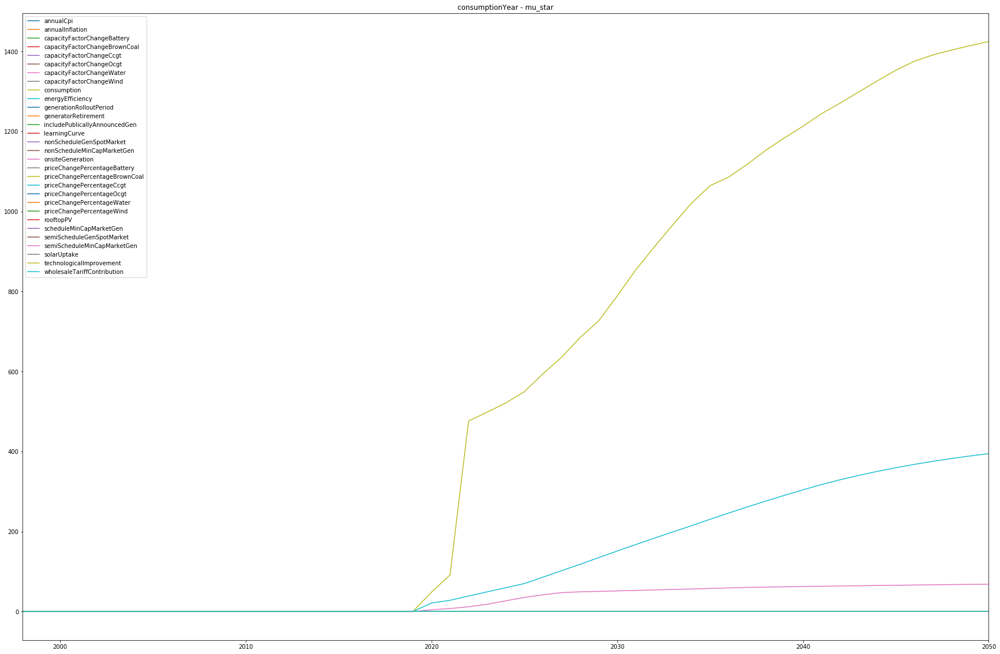

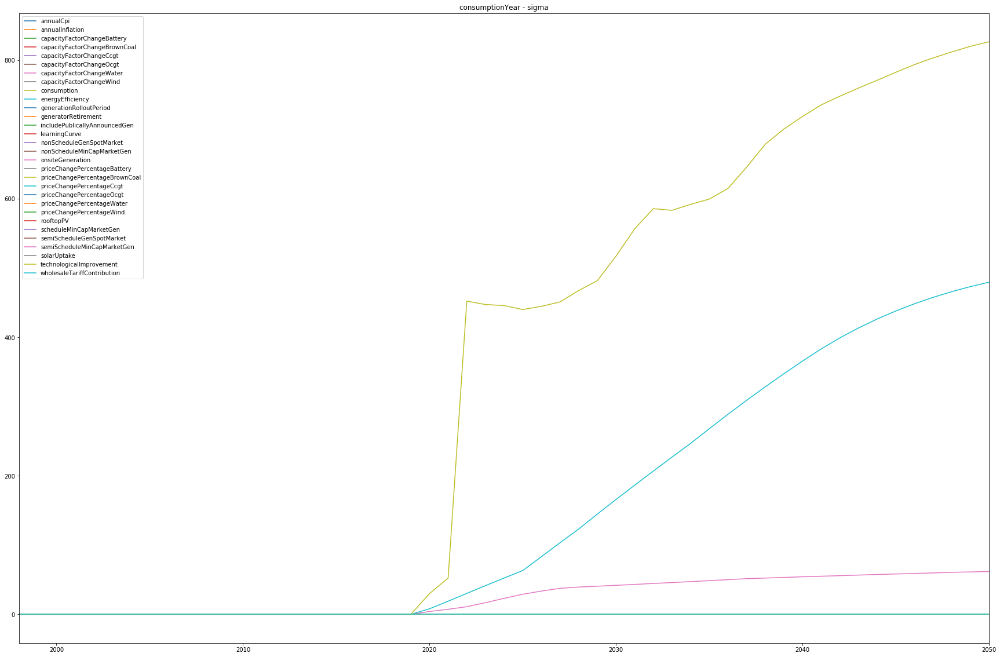

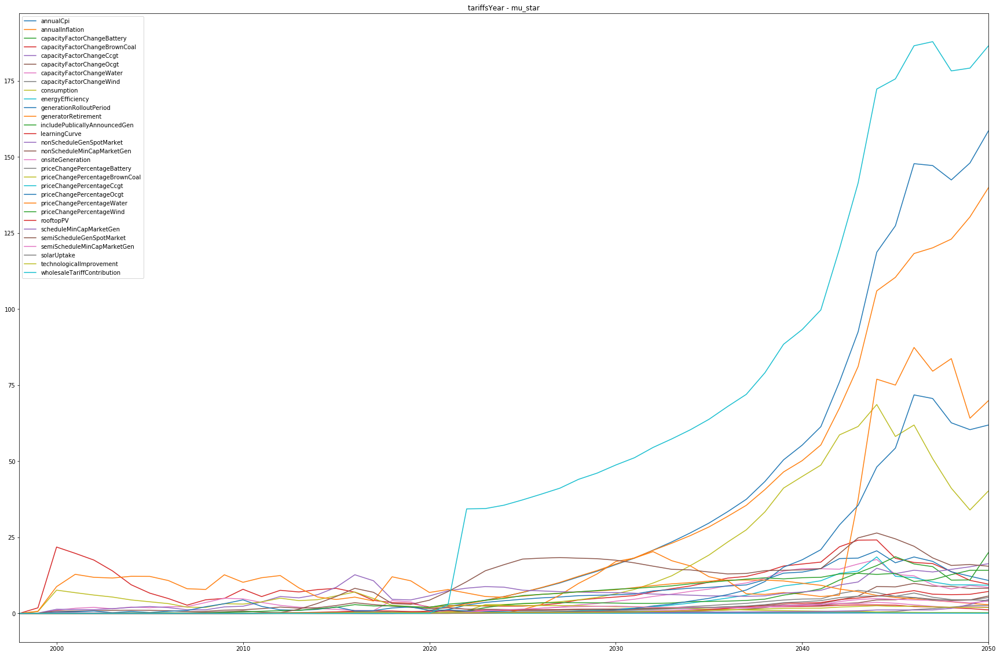

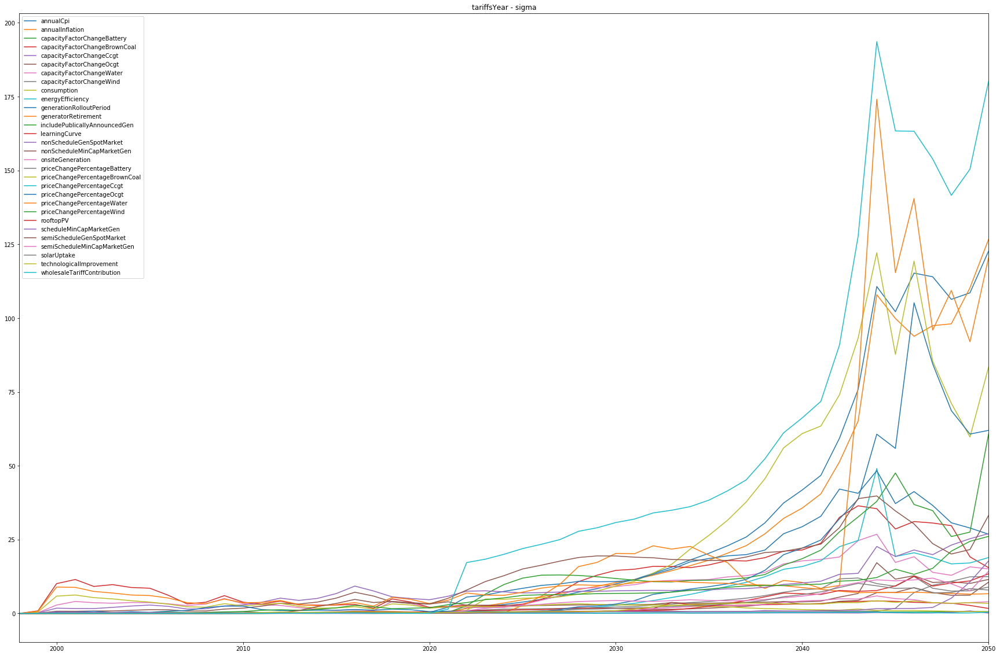

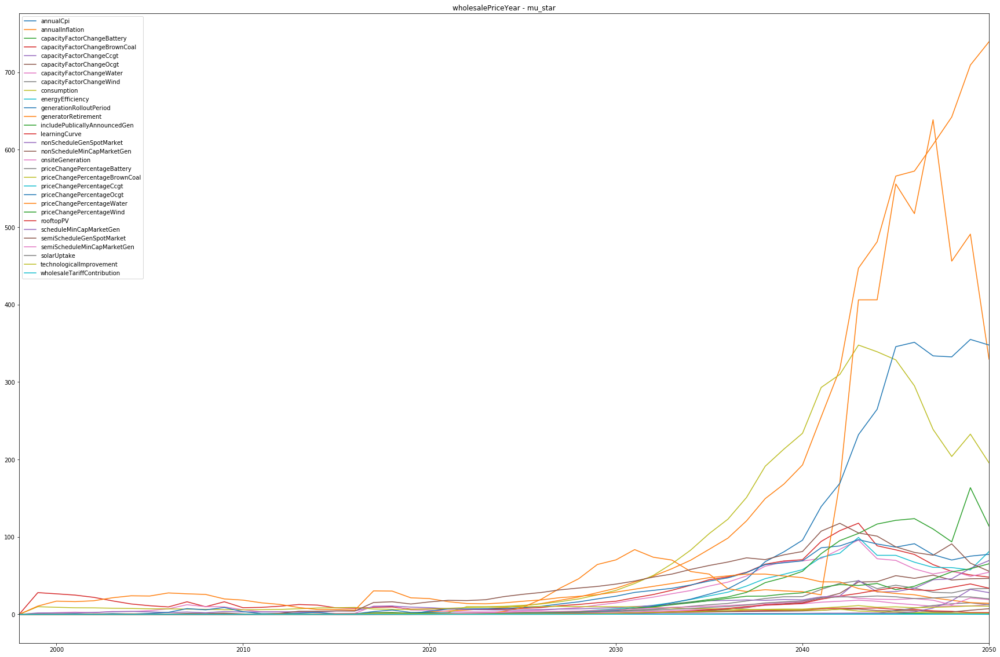

...

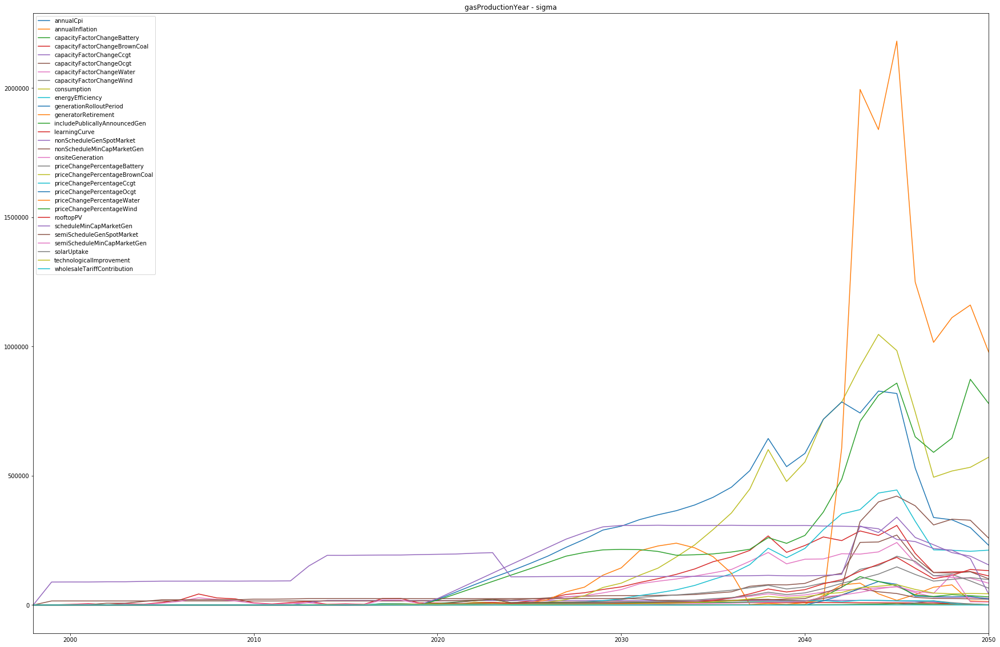

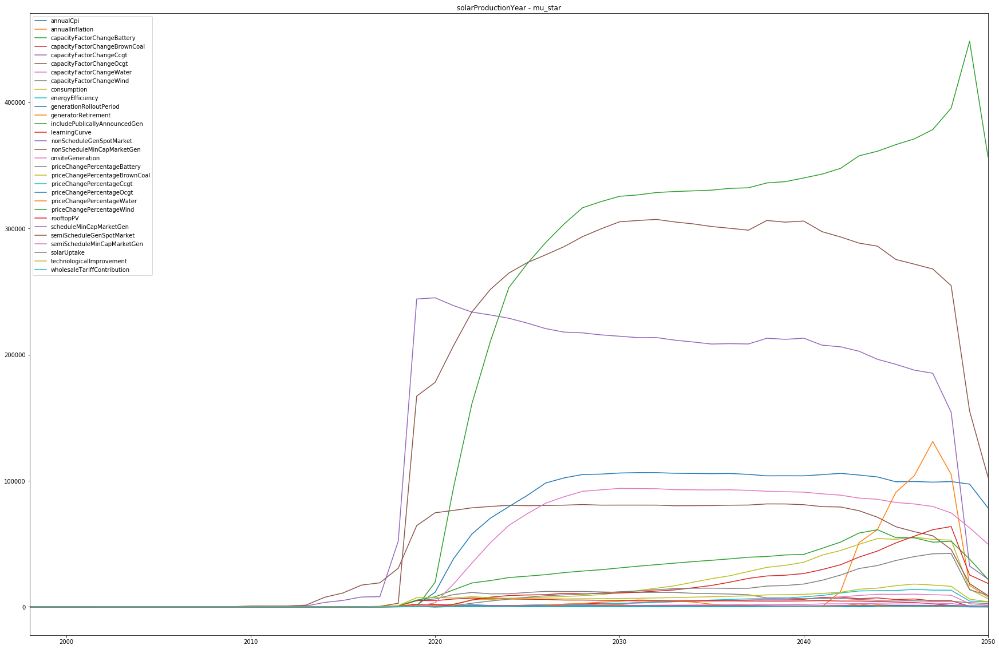

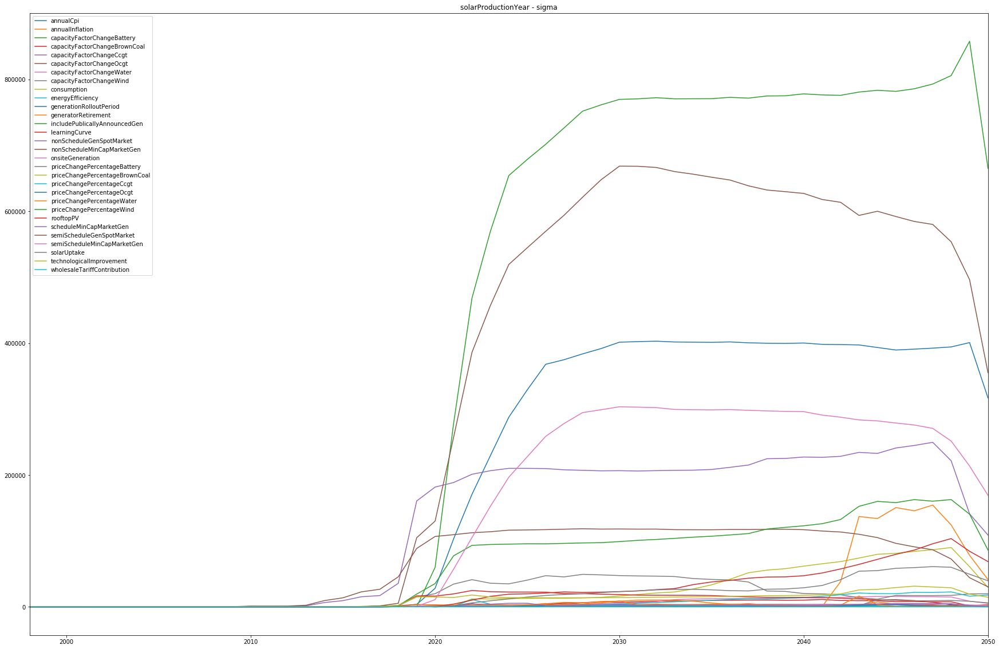

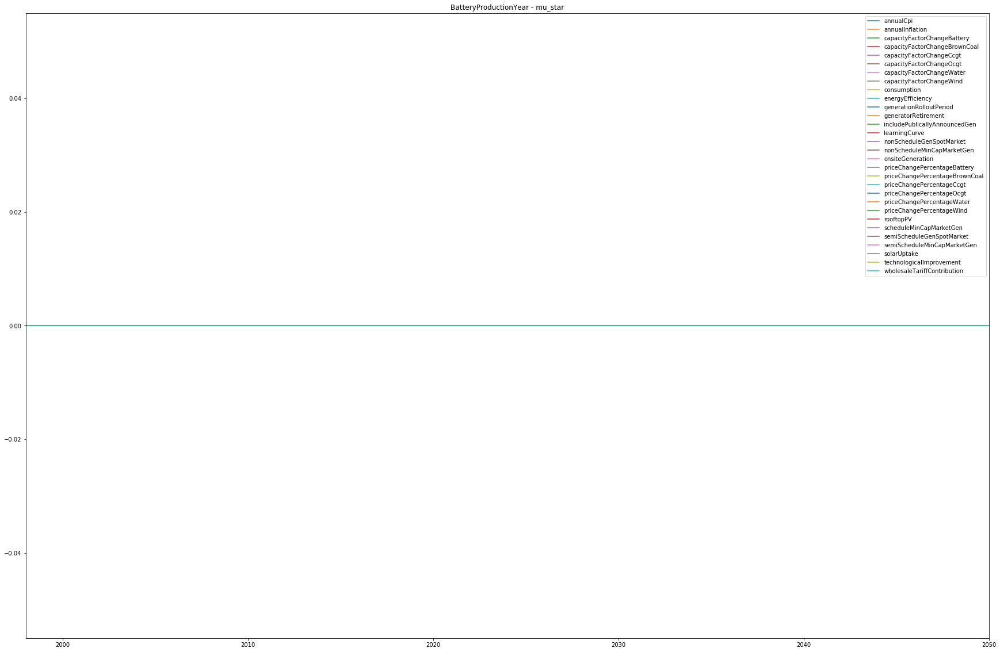

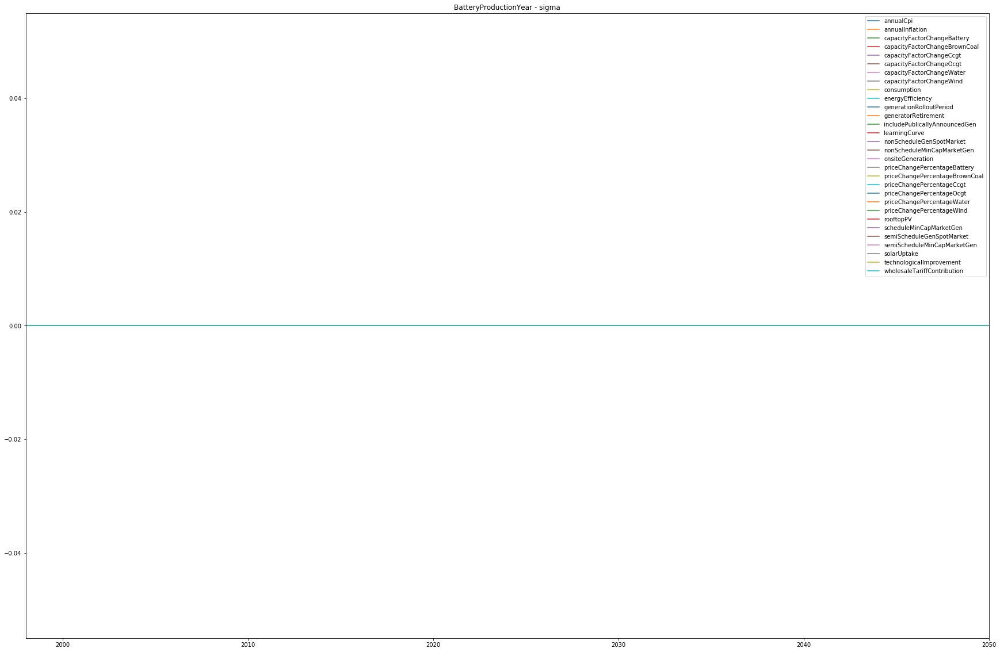

In [8]:
from SALib.analyze import morris

sigma_years_ooi = {}
mu_star_years_ooi = {}
for ooi in outcomes_to_show:
    mu_star_years = pd.DataFrame([],columns=uncertainties)
    sigma_years = pd.DataFrame([],columns=uncertainties)
    for t in range(startYearShift, startYearShift + len(time)):
        dataY = outcomes[ooi][:, t]
        #change num_levels = p to do the analysis with p levels
        Si = morris.analyze(problem, X, dataY, num_levels=6)
        
        morris_stats = {key: Si[key] for key in ['mu', 'mu_star', 'sigma',
                                                           'mu_star_conf']}
        morris_stats = pd.DataFrame(morris_stats, index=uncertainties)
        
        mu_star = pd.DataFrame([morris_stats['mu_star']],columns=uncertainties)                    
        mu_star_years = mu_star_years.append(mu_star)
        
        sigma = pd.DataFrame([Si['sigma']], columns=uncertainties)
        sigma_years = sigma_years.append(sigma)
    
    mu_star_years = mu_star_years.set_index(time)
    sigma_years = sigma_years.set_index(time)
    
    mu_star_years_ooi[ooi] = mu_star_years
    sigma_years_ooi[ooi] = sigma_years
    print(ooi)
    
    # Figure showing timeseries of mu* and sigma for each output and lever
    plt_mu_star_years = mu_star_years.plot.line(title=ooi+' - mu_star', figsize=(30, 20))
    plt_sigma_years = sigma_years.plot.line(title=ooi + ' - sigma', figsize=(30, 20))

    plt_mu_star_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_mu_star_years_%s'%(ooi)), 
                     dpi=300, bbox_inches='tight')
    plt_sigma_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_sigma_years_%s'%(ooi)), 
                     dpi=300, bbox_inches='tight')    




In [9]:
import matplotlib.ticker as ticker


for ooi in outcomes_to_show:
    mu_star_years = mu_star_years_ooi[ooi]
    for t in range(startYearShift, startYearShift + len(time)):            
        mu_star = pd.DataFrame([mu_star_years.iloc[t]],columns=uncertainties).T  
        mu_star.columns = ['mu_star']
        mu_star = mu_star.sort_values(by='mu_star', ascending=False)
        # mu_star['num_index'] = np.arange(len(problem['names']))
        year = mu_star_years.index[t]
        print(ooi + ' - year ' + str(year))
        print(mu_star[:5])
        
        

        # f = plt.figure(figsize=(30,20))    
        # chart = sns.barplot(
        #     data=mu_star,
        #     x=mu_star.index,
        #     y='mu_star'
        # 
        # )
        # xlabels = chart.get_xticklabels()        
        # chart.set_xticklabels(xlabels, rotation=90)
        # f.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\figs', '_mu_star_year_%d_%s'%(year,ooi)), 
        #                     dpi=300, bbox_inches='tight')
        # 
        # f.clear()
        # plt.close(f)

consumptionYear - year 1998
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
consumptionYear - year 1999
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
consumptionYear - year 2000
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
consumptionYear - year 2001
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0


technologicalImprovement     0.000000
consumptionYear - year 2039
                              mu_star
consumption               1183.794514
energyEfficiency           290.379070
onsiteGeneration            61.766945
annualCpi                    0.000000
technologicalImprovement     0.000000
consumptionYear - year 2040
                              mu_star
consumption               1213.040123
energyEfficiency           304.128383
onsiteGeneration            62.581054
annualCpi                    0.000000
technologicalImprovement     0.000000
consumptionYear - year 2041
                              mu_star
consumption               1244.289591
energyEfficiency           317.370528
onsiteGeneration            63.147298
annualCpi                    0.000000
technologicalImprovement     0.000000
consumptionYear - year 2042
                              mu_star
consumption               1270.698783
energyEfficiency           329.355627
onsiteGeneration            63.807694
annualCpi     

tariffsYear - year 2029
                               mu_star
wholesaleTariffContribution  46.112559
semiScheduleGenSpotMarket    17.981293
annualInflation              14.095263
annualCpi                    13.857913
generatorRetirement          12.989280
tariffsYear - year 2030
                               mu_star
wholesaleTariffContribution  48.776620
semiScheduleGenSpotMarket    17.486710
generatorRetirement          17.057518
annualInflation              16.252002
annualCpi                    16.044280
tariffsYear - year 2031
                               mu_star
wholesaleTariffContribution  51.158747
annualInflation              18.269426
generatorRetirement          18.179165
annualCpi                    18.150476
semiScheduleGenSpotMarket    16.607634
tariffsYear - year 2032
                               mu_star
wholesaleTariffContribution  54.545122
annualCpi                    20.790664
annualInflation              20.726978
generatorRetirement          20.302600
semiSch

wholesalePriceYear - year 2019
                                  mu_star
priceChangePercentageWater      21.344319
semiScheduleGenSpotMarket       13.356126
nonScheduleGenSpotMarket         9.366517
capacityFactorChangeBrownCoal    6.723723
priceChangePercentageBrownCoal   6.253409
wholesalePriceYear - year 2020
                                  mu_star
priceChangePercentageWater      20.353392
semiScheduleGenSpotMarket       16.054797
nonScheduleGenSpotMarket         8.651765
capacityFactorChangeBrownCoal    6.974926
priceChangePercentageBrownCoal   6.811856
wholesalePriceYear - year 2021
                                  mu_star
semiScheduleGenSpotMarket       18.118929
priceChangePercentageWater      16.366070
priceChangePercentageBrownCoal   7.833586
nonScheduleGenSpotMarket         7.287658
generationRolloutPeriod          6.849793
wholesalePriceYear - year 2022
                                  mu_star
semiScheduleGenSpotMarket       17.808967
priceChangePercentageWater      13.9

nonScheduleGenSpotMarket        0.623142
GHGYear - year 2013
                                 mu_star
priceChangePercentageWater      1.876727
priceChangePercentageBrownCoal  1.243660
nonScheduleGenSpotMarket        0.745488
capacityFactorChangeWater       0.743395
capacityFactorChangeBrownCoal   0.740192
GHGYear - year 2014
                                 mu_star
priceChangePercentageWater      1.879855
priceChangePercentageBrownCoal  1.251857
nonScheduleGenSpotMarket        0.821849
capacityFactorChangeWater       0.744387
semiScheduleGenSpotMarket       0.718727
GHGYear - year 2015
                                 mu_star
priceChangePercentageWater      1.825508
priceChangePercentageBrownCoal  1.217971
nonScheduleGenSpotMarket        0.973382
semiScheduleGenSpotMarket       0.797258
capacityFactorChangeWater       0.720525
GHGYear - year 2016
                                 mu_star
priceChangePercentageWater      1.748029
priceChangePercentageBrownCoal  1.168773
nonScheduleGenSpot

primarySpotProductionYear - year 2005
                                 mu_star
nonScheduleGenSpotMarket    1.664465e+06
nonScheduleMinCapMarketGen  5.308508e+05
scheduleMinCapMarketGen     1.259785e+05
capacityFactorChangeWater   9.837964e+04
capacityFactorChangeWind    2.849000e+04
primarySpotProductionYear - year 2006
                                 mu_star
nonScheduleGenSpotMarket    1.785007e+06
nonScheduleMinCapMarketGen  6.104481e+05
scheduleMinCapMarketGen     1.259784e+05
capacityFactorChangeWater   1.094505e+05
capacityFactorChangeWind    3.287624e+04
primarySpotProductionYear - year 2007
                                 mu_star
nonScheduleGenSpotMarket    1.991430e+06
nonScheduleMinCapMarketGen  6.606406e+05
scheduleMinCapMarketGen     1.260014e+05
capacityFactorChangeWater   1.021176e+05
capacityFactorChangeWind    4.207424e+04
primarySpotProductionYear - year 2008
                                    mu_star
nonScheduleGenSpotMarket       2.017719e+06
nonScheduleMinCapMarke

primarySpotProductionYear - year 2045
                                mu_star
generatorRetirement        1.455508e+07
semiScheduleGenSpotMarket  1.185885e+07
consumption                8.497111e+06
nonScheduleGenSpotMarket   6.291461e+06
generationRolloutPeriod    3.410249e+06
primarySpotProductionYear - year 2046
                                mu_star
generatorRetirement        1.867555e+07
semiScheduleGenSpotMarket  1.055529e+07
consumption                7.485591e+06
nonScheduleGenSpotMarket   6.444223e+06
generationRolloutPeriod    3.131181e+06
primarySpotProductionYear - year 2047
                                    mu_star
generatorRetirement            2.880296e+07
semiScheduleGenSpotMarket      9.408494e+06
nonScheduleGenSpotMarket       6.646078e+06
consumption                    6.624547e+06
includePublicallyAnnouncedGen  3.168863e+06
primarySpotProductionYear - year 2048
                                    mu_star
generatorRetirement            2.786031e+07
semiScheduleGenS

nonScheduleMinCapMarketGen  4.813397e+05
secondarySpotProductionYear - year 2034
                                 mu_star
semiScheduleGenSpotMarket   9.750318e+06
nonScheduleGenSpotMarket    3.322963e+06
generationRolloutPeriod     1.220959e+06
consumption                 7.013724e+05
nonScheduleMinCapMarketGen  4.934177e+05
secondarySpotProductionYear - year 2035
                                 mu_star
semiScheduleGenSpotMarket   9.792539e+06
nonScheduleGenSpotMarket    3.364581e+06
generationRolloutPeriod     1.236787e+06
consumption                 7.290410e+05
nonScheduleMinCapMarketGen  5.067075e+05
secondarySpotProductionYear - year 2036
                                 mu_star
semiScheduleGenSpotMarket   9.894565e+06
nonScheduleGenSpotMarket    3.367962e+06
generationRolloutPeriod     1.263451e+06
consumption                 7.391328e+05
nonScheduleMinCapMarketGen  5.215284e+05
secondarySpotProductionYear - year 2037
                                 mu_star
semiScheduleGenSpotM

offSpotProductionYear - year 2023
                                    mu_star
semiScheduleGenSpotMarket      1.126287e+07
nonScheduleGenSpotMarket       6.726082e+06
generationRolloutPeriod        4.711278e+06
nonScheduleMinCapMarketGen     4.416527e+06
includePublicallyAnnouncedGen  3.431083e+06
offSpotProductionYear - year 2024
                                    mu_star
semiScheduleGenSpotMarket      1.351720e+07
nonScheduleGenSpotMarket       6.818758e+06
generationRolloutPeriod        5.805460e+06
nonScheduleMinCapMarketGen     4.525639e+06
includePublicallyAnnouncedGen  4.366563e+06
offSpotProductionYear - year 2025
                                    mu_star
semiScheduleGenSpotMarket      1.445641e+07
nonScheduleGenSpotMarket       6.909808e+06
generationRolloutPeriod        6.751504e+06
includePublicallyAnnouncedGen  5.025953e+06
nonScheduleMinCapMarketGen     4.370785e+06
offSpotProductionYear - year 2026
                                    mu_star
semiScheduleGenSpotMarket   

nonScheduleGenSpotMarket        0.074850
renewableContributionYear - year 2014
                                 mu_star
priceChangePercentageWater      0.273026
priceChangePercentageBrownCoal  0.179702
capacityFactorChangeWater       0.107933
capacityFactorChangeBrownCoal   0.107315
nonScheduleGenSpotMarket        0.088311
renewableContributionYear - year 2015
                                 mu_star
priceChangePercentageWater      0.277736
priceChangePercentageBrownCoal  0.182819
capacityFactorChangeWater       0.109101
nonScheduleGenSpotMarket        0.108513
capacityFactorChangeBrownCoal   0.105067
renewableContributionYear - year 2016
                                 mu_star
priceChangePercentageWater      0.279665
priceChangePercentageBrownCoal  0.184301
nonScheduleGenSpotMarket        0.131104
capacityFactorChangeWater       0.109947
capacityFactorChangeBrownCoal   0.099633
renewableContributionYear - year 2017
                                 mu_star
priceChangePercentageWater  

rooftopPVProductionYear - year 2004
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
rooftopPVProductionYear - year 2005
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
rooftopPVProductionYear - year 2006
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
rooftopPVProductionYear - year 2007
                                mu_star
technologicalImprovement     301.120587
nonScheduleMinCapMarketGen   277.168758
nonScheduleGenSpotMarket     154.552252
priceChangePercentageOcgt     

rooftopPVProductionYear - year 2050
                                 mu_star
nonScheduleGenSpotMarket    4.000178e+06
rooftopPV                   3.458883e+06
solarUptake                 2.722285e+06
nonScheduleMinCapMarketGen  2.273949e+06
technologicalImprovement    1.460178e+06
coalProductionYear - year 1998
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
coalProductionYear - year 1999
                                     mu_star
priceChangePercentageWater      8.280199e+06
priceChangePercentageBrownCoal  5.558546e+06
capacityFactorChangeWater       3.198241e+06
capacityFactorChangeBrownCoal   2.536671e+06
nonScheduleGenSpotMarket        6.668831e+05
coalProductionYear - year 2000
                                     mu_star
priceChangePercentageWater      8.048414e+06
priceChangePercentageBrownCoal  5.325723e+0

coalProductionYear - year 2041
                                     mu_star
capacityFactorChangeBrownCoal   5.165741e+06
semiScheduleGenSpotMarket       4.565787e+06
priceChangePercentageWater      3.942795e+06
priceChangePercentageBrownCoal  2.525230e+06
consumption                     2.344130e+06
coalProductionYear - year 2042
                                    mu_star
capacityFactorChangeBrownCoal  5.012675e+06
semiScheduleGenSpotMarket      3.947267e+06
generatorRetirement            3.458285e+06
priceChangePercentageWater     3.151233e+06
consumption                    2.074230e+06
coalProductionYear - year 2043
                                    mu_star
generatorRetirement            1.218352e+07
capacityFactorChangeBrownCoal  4.383515e+06
semiScheduleGenSpotMarket      3.161129e+06
priceChangePercentageWater     2.270282e+06
consumption                    1.796666e+06
coalProductionYear - year 2044
                                    mu_star
generatorRetirement            1.6

waterProductionYear - year 2032
                                     mu_star
priceChangePercentageWater      7.476868e+06
semiScheduleGenSpotMarket       6.393067e+06
generatorRetirement             5.139859e+06
capacityFactorChangeBrownCoal   4.466064e+06
priceChangePercentageBrownCoal  4.294297e+06
waterProductionYear - year 2033
                                     mu_star
priceChangePercentageWater      7.274558e+06
semiScheduleGenSpotMarket       6.955572e+06
capacityFactorChangeBrownCoal   4.525370e+06
priceChangePercentageBrownCoal  4.112664e+06
consumption                     4.043778e+06
waterProductionYear - year 2034
                                     mu_star
semiScheduleGenSpotMarket       7.539326e+06
priceChangePercentageWater      7.101008e+06
consumption                     4.714347e+06
capacityFactorChangeBrownCoal   4.695957e+06
priceChangePercentageBrownCoal  3.958381e+06
waterProductionYear - year 2035
                                     mu_star
semiScheduleGenSp

windProductionYear - year 2024
                                    mu_star
semiScheduleGenSpotMarket      2.093101e+07
generationRolloutPeriod        5.325210e+06
nonScheduleGenSpotMarket       3.843128e+06
includePublicallyAnnouncedGen  3.428924e+06
semiScheduleMinCapMarketGen    2.218991e+06
windProductionYear - year 2025
                                    mu_star
semiScheduleGenSpotMarket      2.196553e+07
generationRolloutPeriod        5.778913e+06
includePublicallyAnnouncedGen  3.945113e+06
nonScheduleGenSpotMarket       3.826825e+06
semiScheduleMinCapMarketGen    2.602044e+06
windProductionYear - year 2026
                                    mu_star
semiScheduleGenSpotMarket      2.262215e+07
generationRolloutPeriod        6.096718e+06
includePublicallyAnnouncedGen  4.166656e+06
nonScheduleGenSpotMarket       3.845251e+06
semiScheduleMinCapMarketGen    2.950927e+06
windProductionYear - year 2027
                                    mu_star
semiScheduleGenSpotMarket      2.317023e

gasProductionYear - year 2020
                                     mu_star
nonScheduleGenSpotMarket       514912.742014
capacityFactorChangeBrownCoal   18137.458494
nonScheduleMinCapMarketGen      16306.064798
capacityFactorChangeOcgt        15495.726457
capacityFactorChangeCcgt        14428.122219
gasProductionYear - year 2021
                                     mu_star
nonScheduleGenSpotMarket       512002.648343
generationRolloutPeriod         19244.238215
nonScheduleMinCapMarketGen      16515.048251
capacityFactorChangeOcgt        15279.430721
capacityFactorChangeBrownCoal   14758.082310
gasProductionYear - year 2022
                                  mu_star
nonScheduleGenSpotMarket    508499.494024
generationRolloutPeriod      24939.597175
scheduleMinCapMarketGen      18420.516257
nonScheduleMinCapMarketGen   16649.821884
capacityFactorChangeOcgt     15467.908572
gasProductionYear - year 2023
                                  mu_star
nonScheduleGenSpotMarket    506142.122530
gene

solarProductionYear - year 2013
                                   mu_star
nonScheduleMinCapMarketGen     1407.046355
nonScheduleGenSpotMarket        653.532098
capacityFactorChangeBrownCoal     4.985272
priceChangePercentageWater        2.266704
priceChangePercentageWind         1.045531
solarProductionYear - year 2014
                                   mu_star
nonScheduleMinCapMarketGen     7589.851171
nonScheduleGenSpotMarket       3509.789774
capacityFactorChangeBrownCoal     8.190086
priceChangePercentageWater        3.821499
semiScheduleGenSpotMarket         3.106225
solarProductionYear - year 2015
                                    mu_star
nonScheduleMinCapMarketGen     11022.497627
nonScheduleGenSpotMarket        5104.590178
capacityFactorChangeBrownCoal     18.956471
priceChangePercentageWater         7.757224
semiScheduleGenSpotMarket          3.432476
solarProductionYear - year 2016
                                    mu_star
nonScheduleMinCapMarketGen     17241.746275
nonS

BatteryProductionYear - year 2004
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2005
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2006
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2007
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleM

BatteryProductionYear - year 2047
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2048
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2049
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
BatteryProductionYear - year 2050
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleM

In [10]:
#Save mu_star into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_mu_star'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    mu_star_years = mu_star_years_ooi[ooi]
    mu_star_years.to_excel(writer, sheet_name=ooi)
writer.save()

#Save sigma into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_sigma'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    sigma_years = sigma_years_ooi[ooi]
    sigma_years.to_excel(writer, sheet_name=ooi)
writer.save()

### Average mu_star and sigma all years in data frame

In [11]:
mu_star_average_ooi = {}
mu_star_max_val_ooi = {}
mu_star_median_ooi = {}
sigma_average_ooi = {}
sigma_max_val_ooi = {}
sigma_median_ooi = {}

for ooi in outcomes_to_show:
    
    mu_star_average_ooi[ooi] = mu_star_years_ooi[ooi].mean()    
    mu_star_max_val_ooi[ooi] = mu_star_years_ooi[ooi].max()
    mu_star_median_ooi[ooi] = mu_star_years_ooi[ooi].median()
    sigma_average_ooi[ooi] = sigma_years_ooi[ooi].mean()
    sigma_max_val_ooi[ooi] = sigma_years_ooi[ooi].max()
    sigma_median_ooi[ooi] = sigma_years_ooi[ooi].median()

### Scatter plots of mu_star vs sigma using max values
Previous figures shown the changes of mu* and sigma over time for each lever/uncertainty and output. However, it is difficult to capture the most significant inputs, for this a mu* vs sigma plot (EET) is more
appropriate.  

consumptionYear
tariffsYear
wholesalePriceYear
GHGYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
renewableContributionYear
rooftopPVProductionYear
coalProductionYear
waterProductionYear
windProductionYear
gasProductionYear
solarProductionYear
BatteryProductionYear


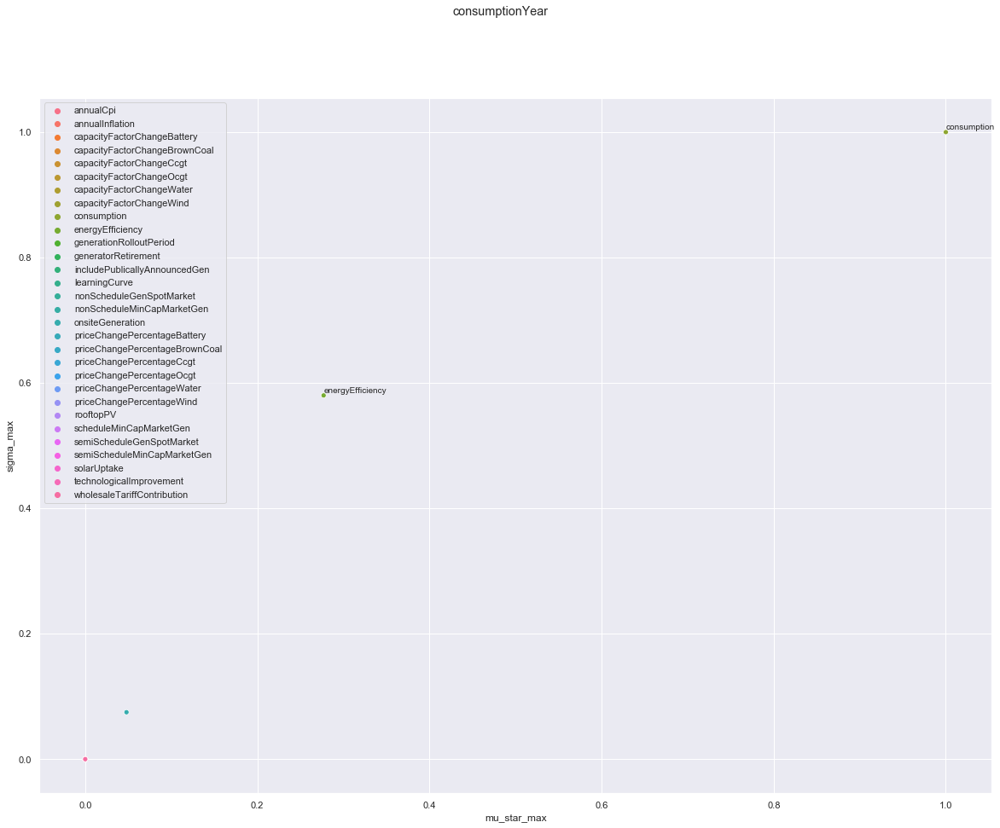

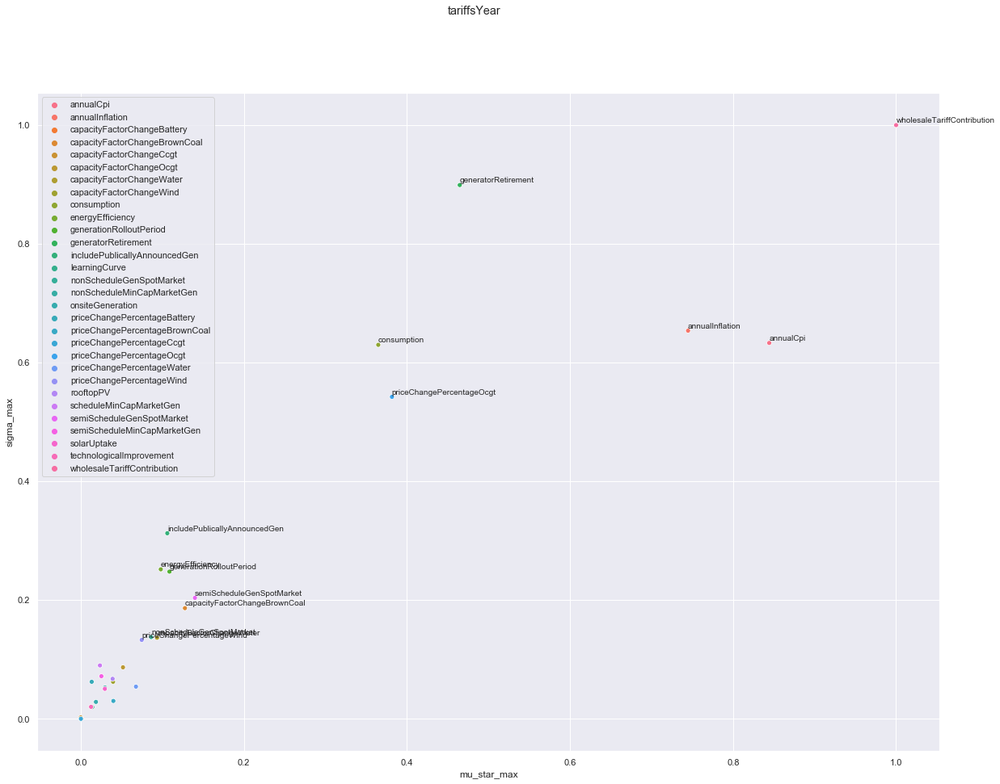

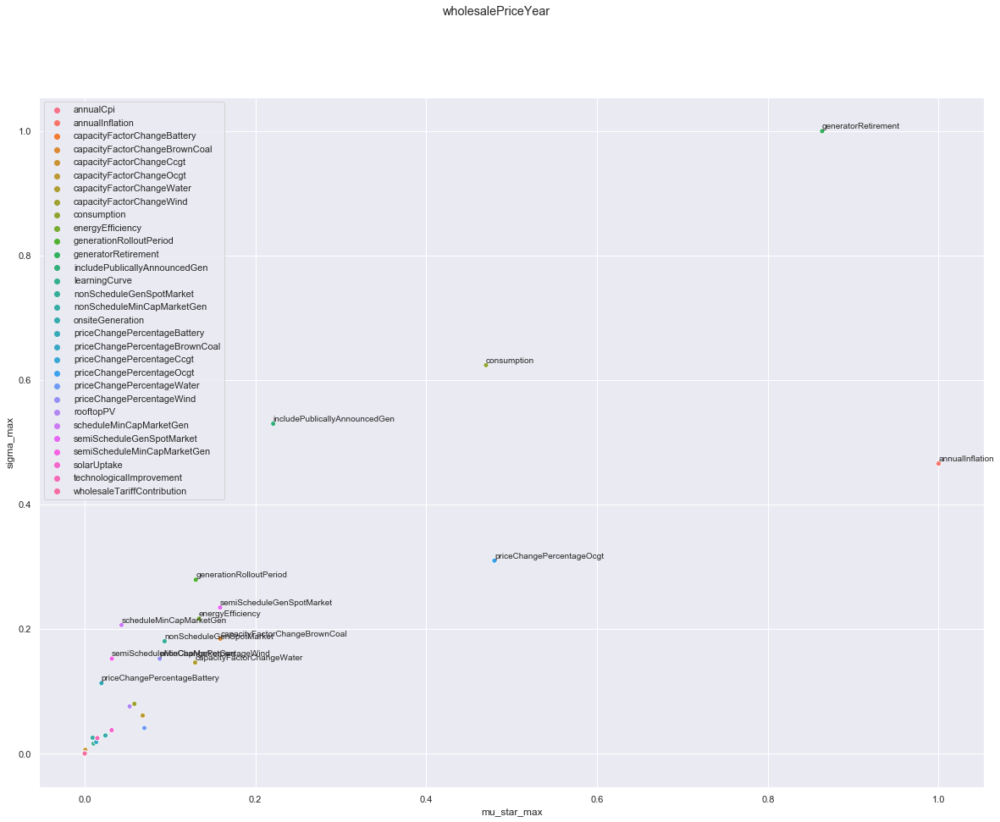

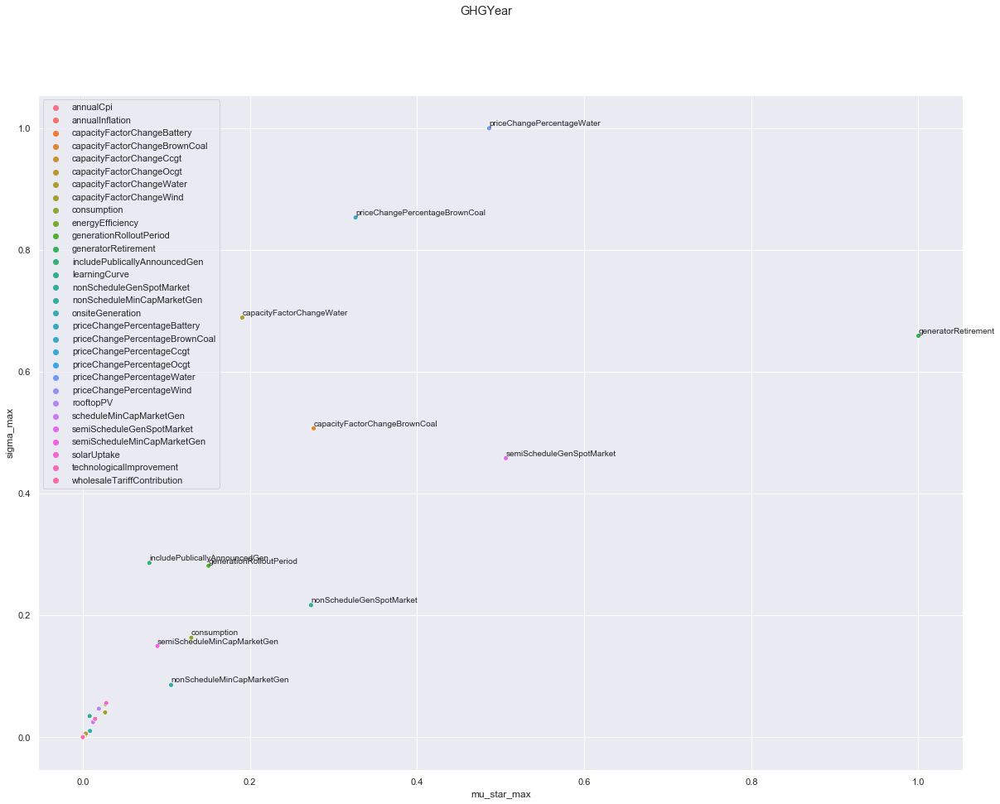

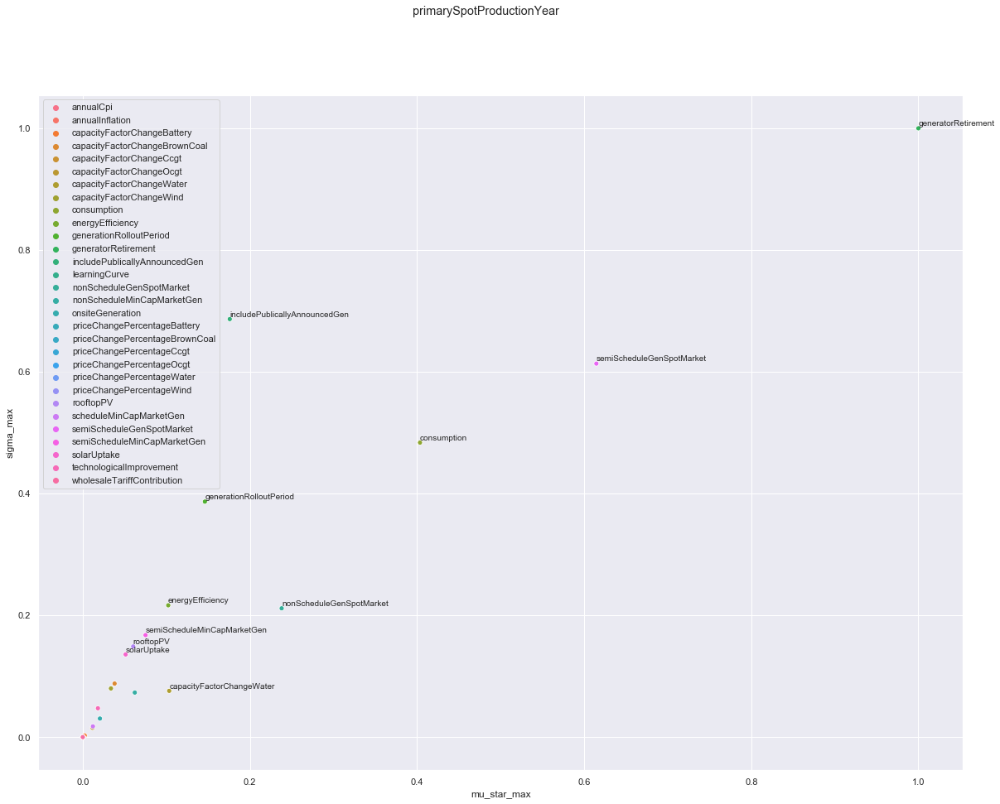

...

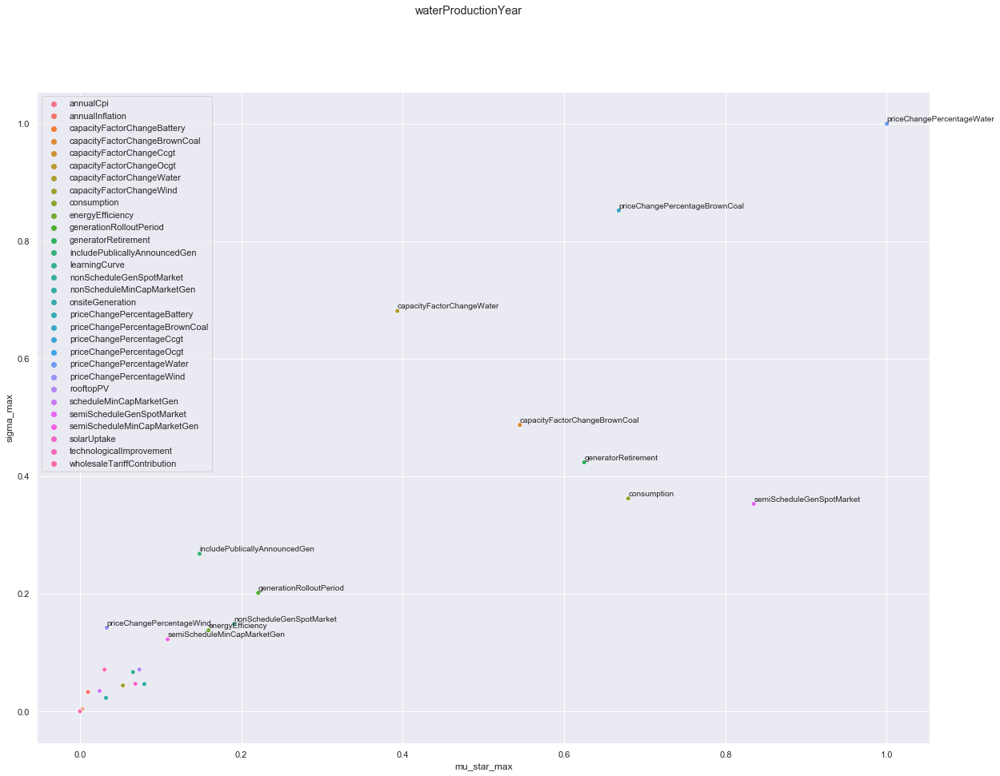

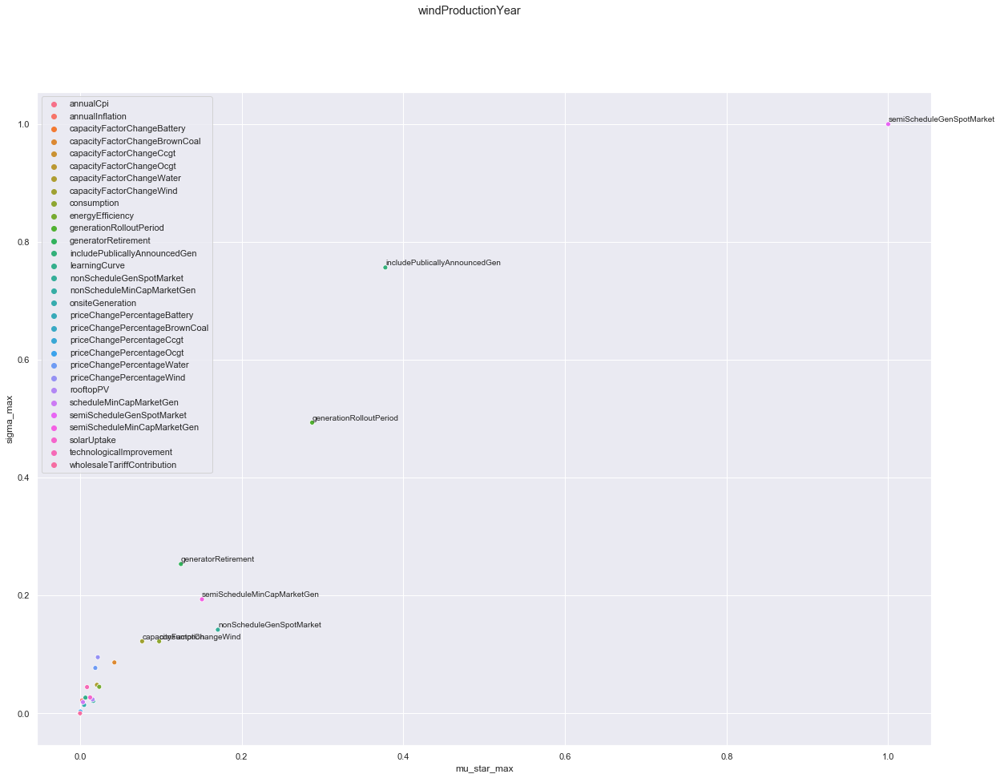

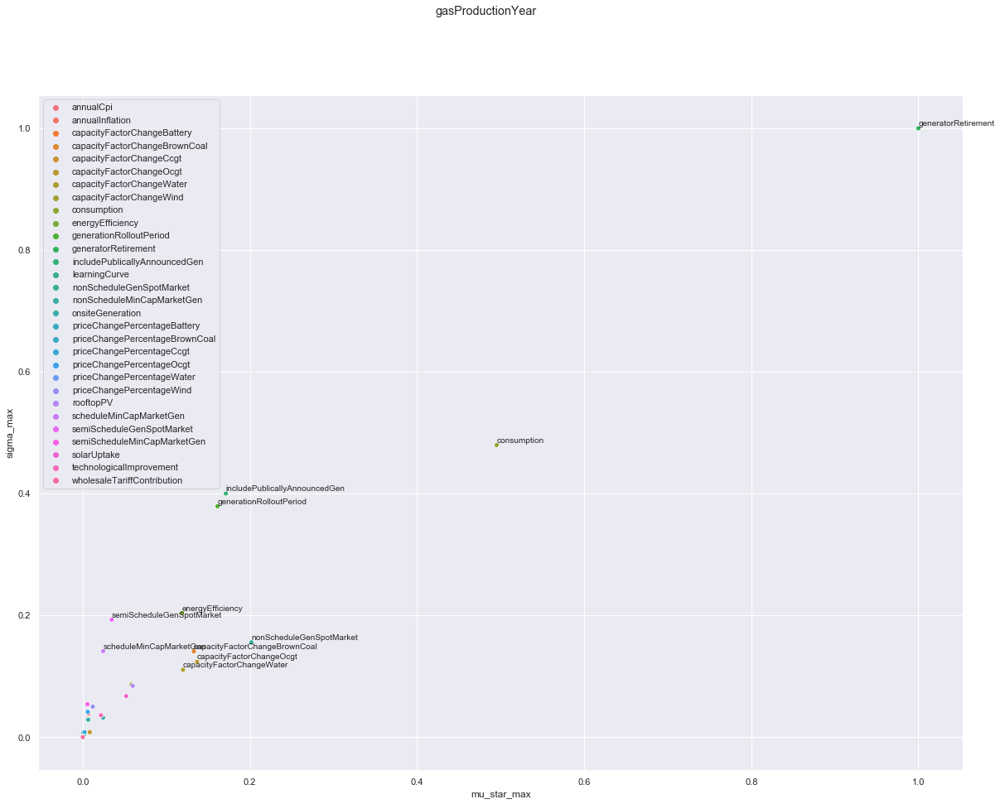

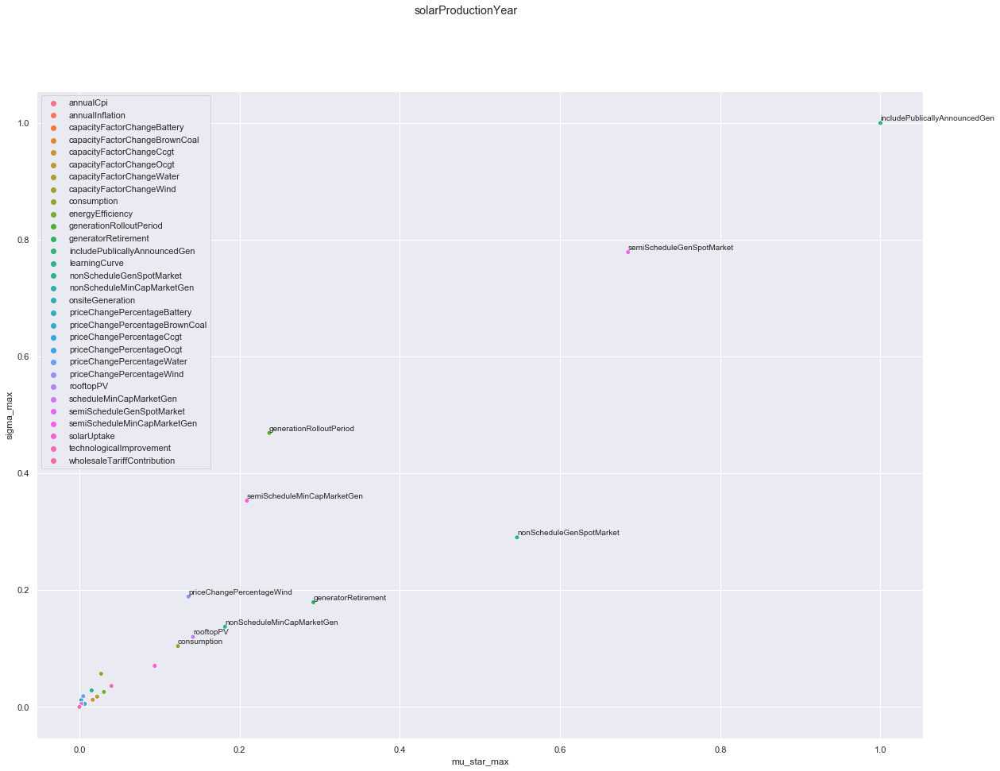

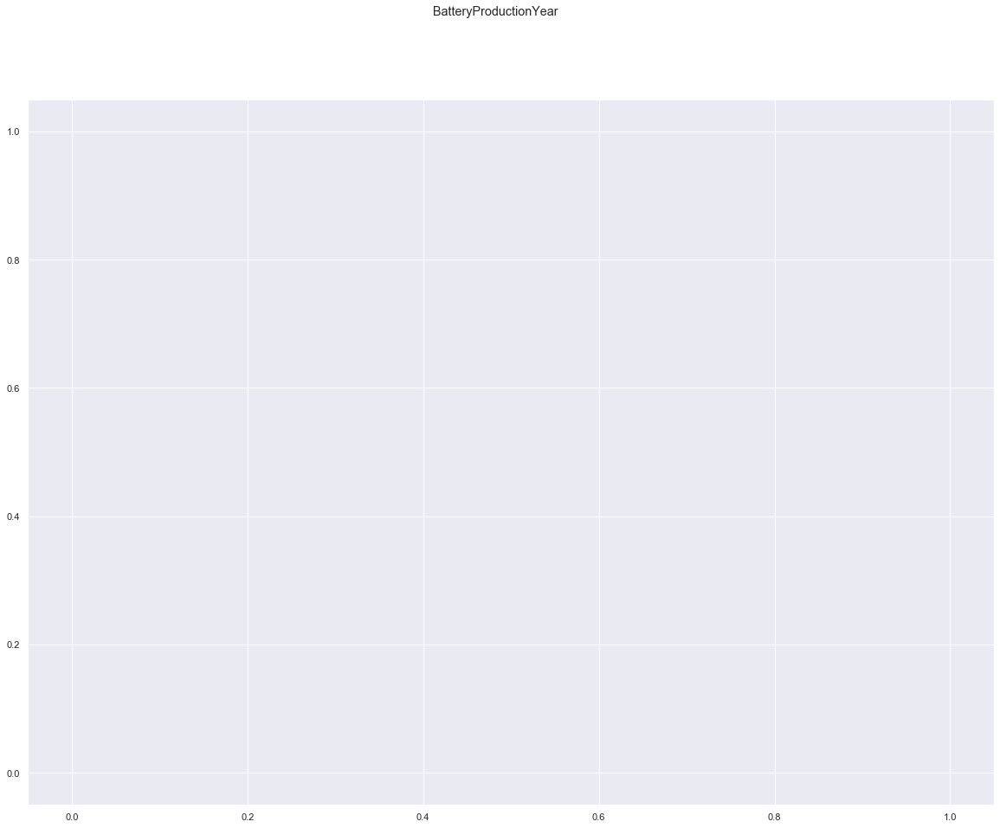

In [12]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

for ooi in outcomes_to_show:
    
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
    normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())
    
    df_max = pd.concat({'mu_star_max': normalized_mu_star,'sigma_max': normalized_sigma}, axis=1)
    
    f=plt.figure(figsize=(20,15))
    f.suptitle(ooi)
    
    
    sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max)
    
    #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')
    
    #Add labels above points
    for index, row in df_max.iterrows():
            if row['mu_star_max'] <= 0.1 and row['sigma_max'] <= 0.1: continue
            plt.annotate(index, # this is the text
                         (row['mu_star_max'],row['sigma_max']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='left', # horizontal alignment can be left, right or center
                         fontsize=10)  # font size



    print(ooi)

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s'%(ooi)),dpi=300, bbox_inches='tight')
    
# f.show()
# f.clear()
# plt.close(f)

### Subset significant factors - normalisation max values
Scatter plots of mu_star vs sigma 

consumptionYear - 2
['consumption' 'energyEfficiency']
tariffsYear - 10
['annualCpi' 'annualInflation' 'consumption' 'energyEfficiency'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'priceChangePercentageOcgt'
 'semiScheduleGenSpotMarket' 'wholesaleTariffContribution']
wholesalePriceYear - 9
['annualInflation' 'consumption' 'energyEfficiency'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'priceChangePercentageOcgt'
 'scheduleMinCapMarketGen' 'semiScheduleGenSpotMarket']
GHGYear - 9
['capacityFactorChangeBrownCoal' 'capacityFactorChangeWater'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'nonScheduleGenSpotMarket'
 'priceChangePercentageBrownCoal' 'priceChangePercentageWater'
 'semiScheduleGenSpotMarket']
primarySpotProductionYear - 7
['consumption' 'energyEfficiency' 'generationRolloutPeriod'
 'generatorRetirement' 'includePublicallyAnnouncedGen'
 'nonScheduleGenSpotMarket' 'semi

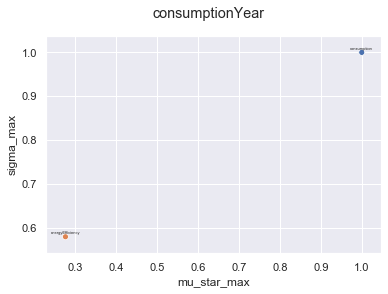

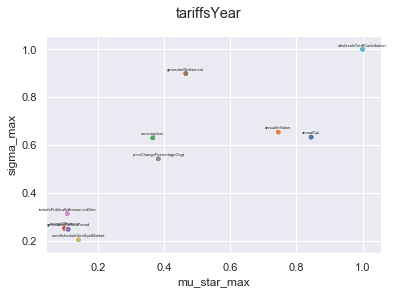

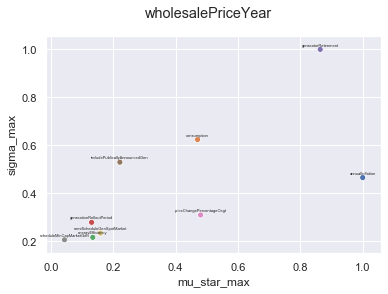

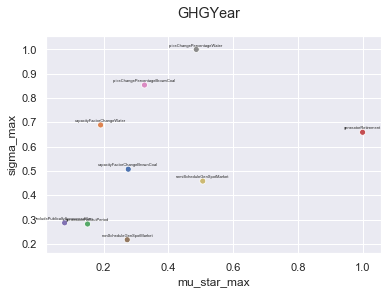

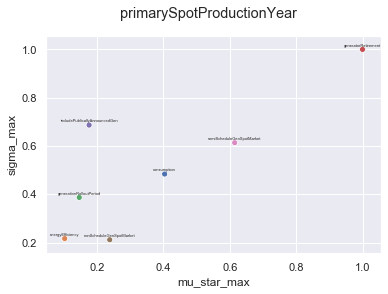

...

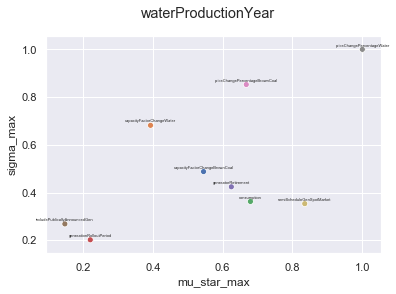

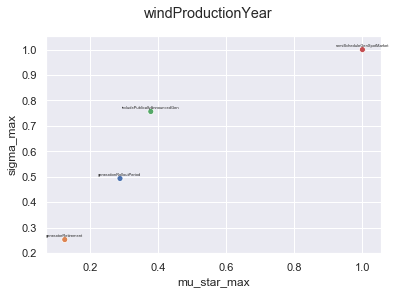

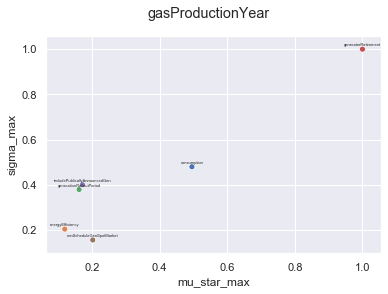

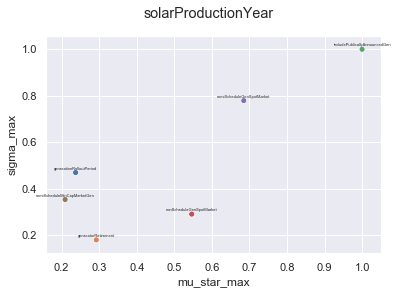

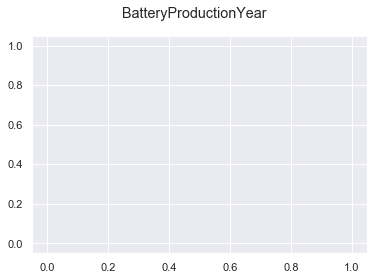

In [13]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.2
significant_inputs_max = set()
significant_inputs_filter_max = {}
for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
    normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())
    
    #filter values
    filter_mu_star = normalized_mu_star > significance_bound
    filter_sigma = normalized_sigma > significance_bound
    normalized_mu_star_filtered = normalized_mu_star[ filter_mu_star | filter_sigma ]
    normalized_sigma_filtered = normalized_sigma[ filter_mu_star | filter_sigma ] 
    
    #keep track significant inputs filter
    significant_inputs_filter_max[ooi] = normalized_mu_star_filtered.index.values
    for l in normalized_mu_star_filtered.index.values:
        significant_inputs_max.add(l) 
    
    #create dataframe     
    df_max = pd.concat({'mu_star_max': normalized_mu_star_filtered,'sigma_max': normalized_sigma_filtered}, axis=1)
    
    #print significant indexes per ooi
    print(ooi + ' - {}'.format(len(significant_inputs_filter_max[ooi])))
    print(significant_inputs_filter_max[ooi])
    
    #create figure
    f=plt.figure()#figsize=(30,20))
    f.suptitle(ooi)
    
    #ScatterPlot        
    #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')
    sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max, legend=False)

    
    #Add labels above points
    for index, row in df_max.iterrows():
            plt.annotate(index, # this is the text
                         (row['mu_star_max'],row['sigma_max']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='center', # horizontal alignment can be left, right or center
                         fontsize=4)  # font size
           
        

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s_filtered'%(ooi)),dpi=300, bbox_inches='tight')
# f.show()
# f.clear()
# plt.close(f)

print("ALL significant inputs (%d)"%len(significant_inputs_max))
print(significant_inputs_max)

In [14]:
normalized_mu_star.index

Index(['annualCpi', 'annualInflation', 'capacityFactorChangeBattery',
       'capacityFactorChangeBrownCoal', 'capacityFactorChangeCcgt',
       'capacityFactorChangeOcgt', 'capacityFactorChangeWater',
       'capacityFactorChangeWind', 'consumption', 'energyEfficiency',
       'generationRolloutPeriod', 'generatorRetirement',
       'includePublicallyAnnouncedGen', 'learningCurve',
       'nonScheduleGenSpotMarket', 'nonScheduleMinCapMarketGen',
       'onsiteGeneration', 'priceChangePercentageBattery',
       'priceChangePercentageBrownCoal', 'priceChangePercentageCcgt',
       'priceChangePercentageOcgt', 'priceChangePercentageWater',
       'priceChangePercentageWind', 'rooftopPV', 'scheduleMinCapMarketGen',
       'semiScheduleGenSpotMarket', 'semiScheduleMinCapMarketGen',
       'solarUptake', 'technologicalImprovement',
       'wholesaleTariffContribution'],
      dtype='object')

In [15]:
### Scatter plots of mu_star vs sigma using mean values

consumptionYear
tariffsYear
wholesalePriceYear
GHGYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
renewableContributionYear
rooftopPVProductionYear
coalProductionYear
waterProductionYear
windProductionYear
gasProductionYear
solarProductionYear
BatteryProductionYear


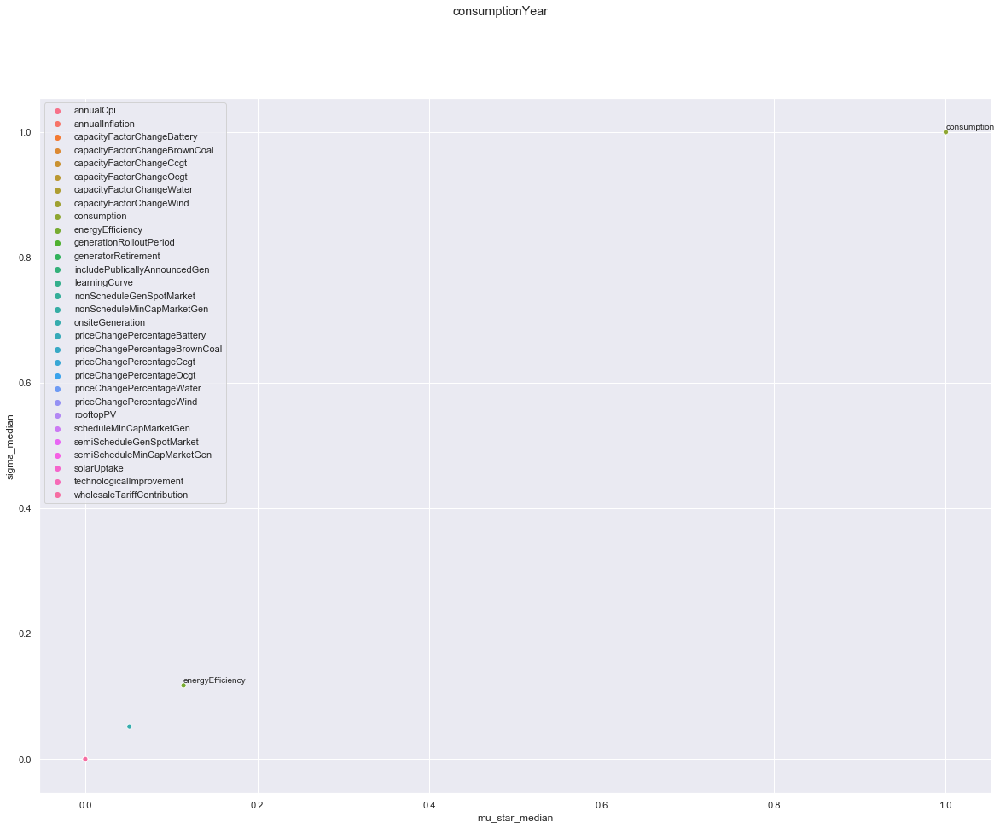

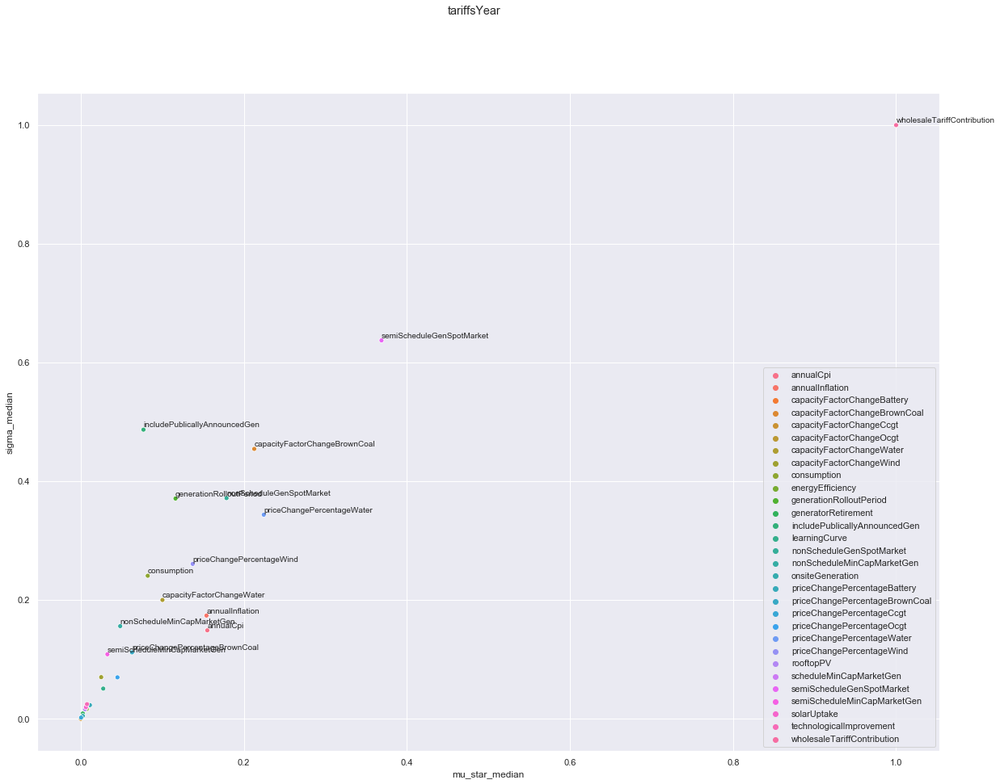

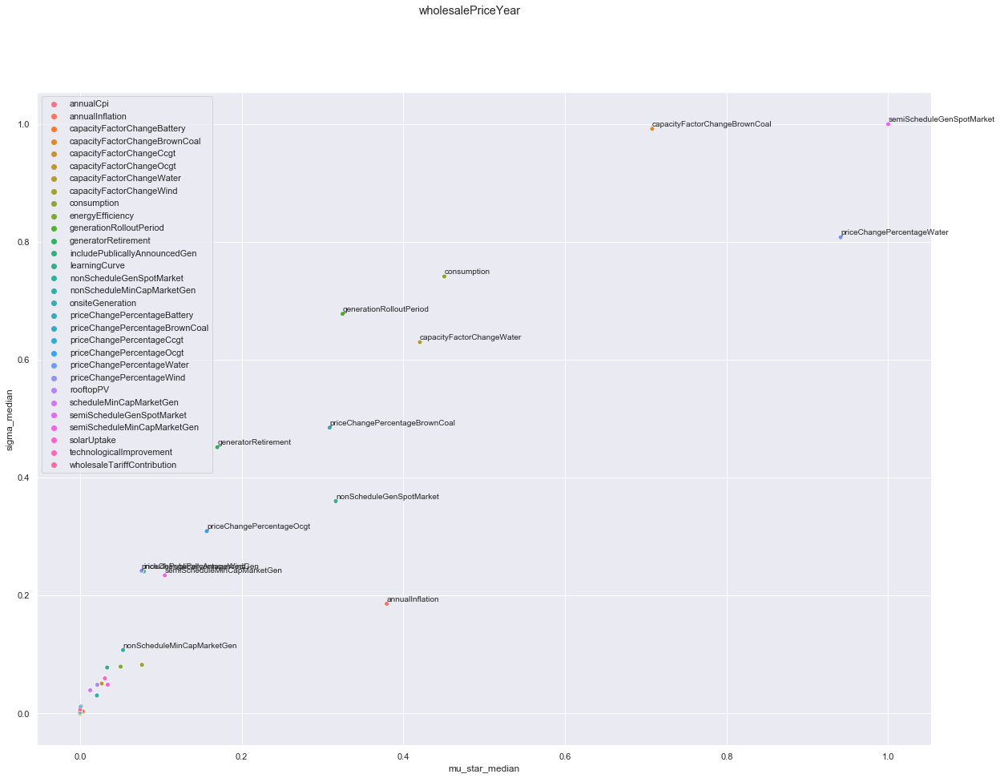

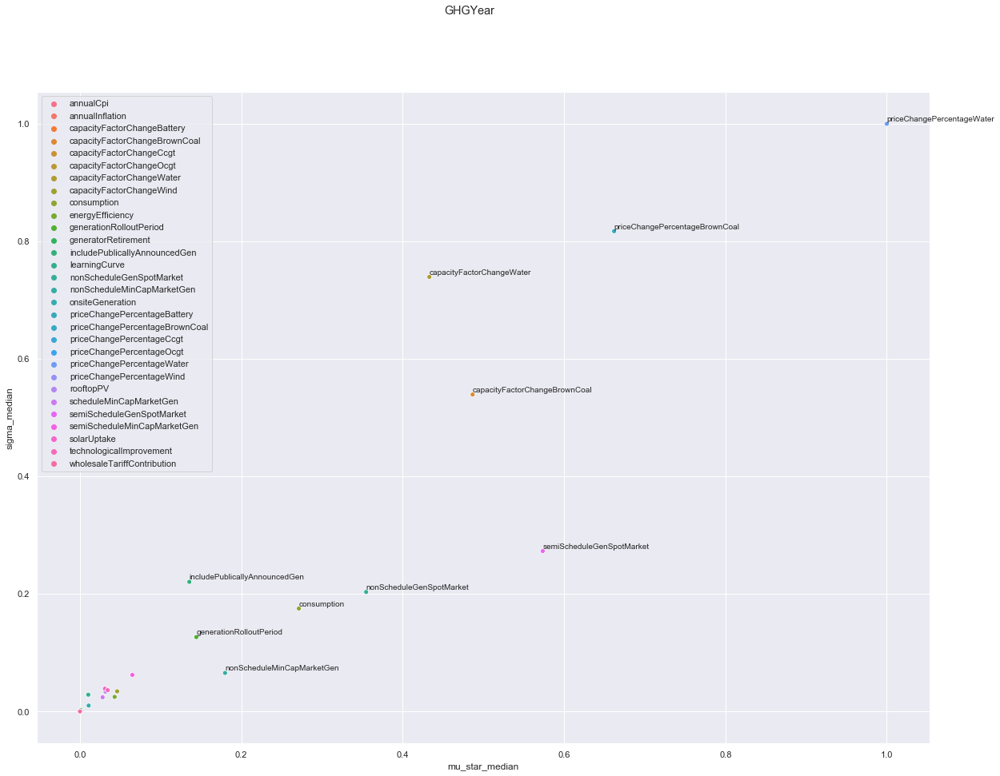

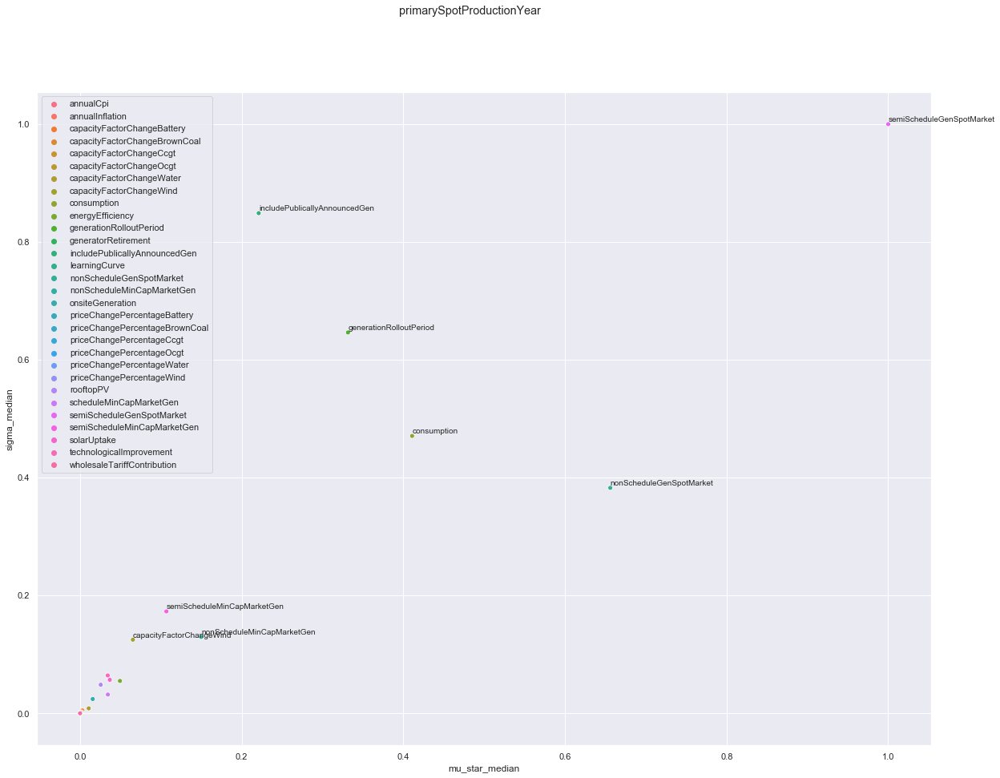

...

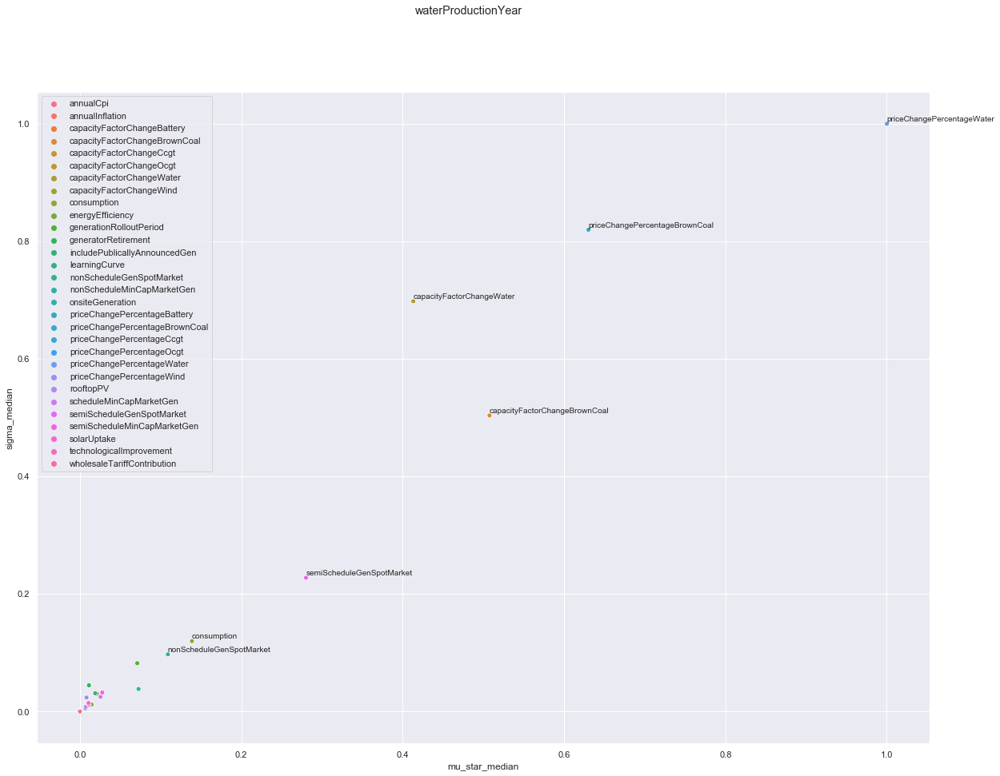

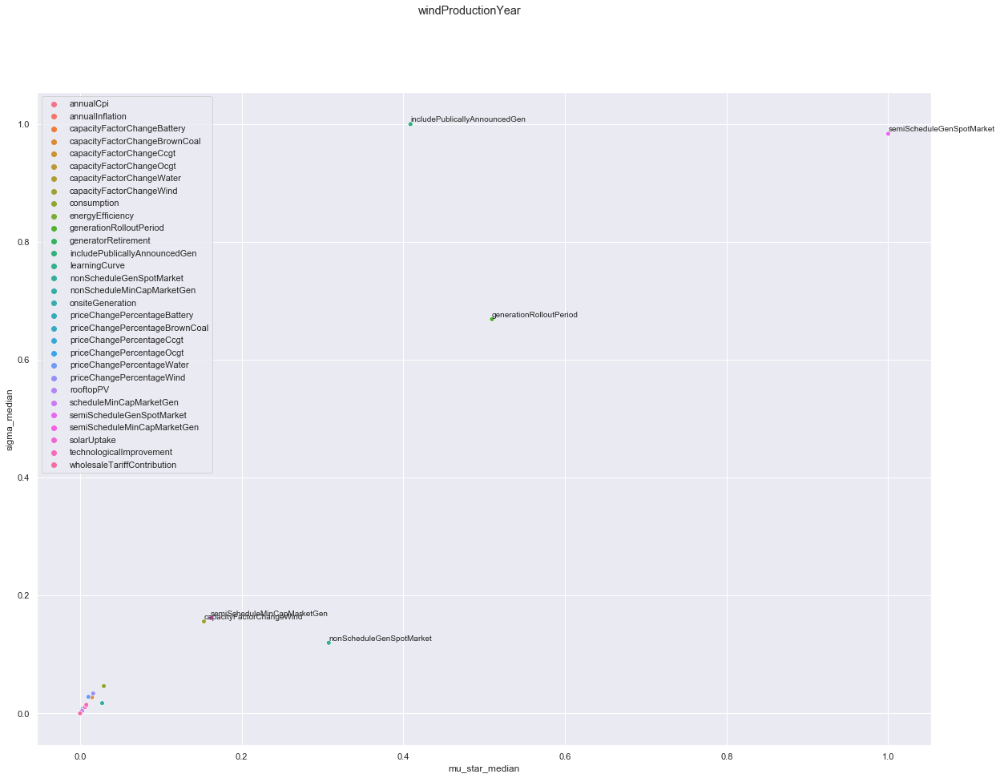

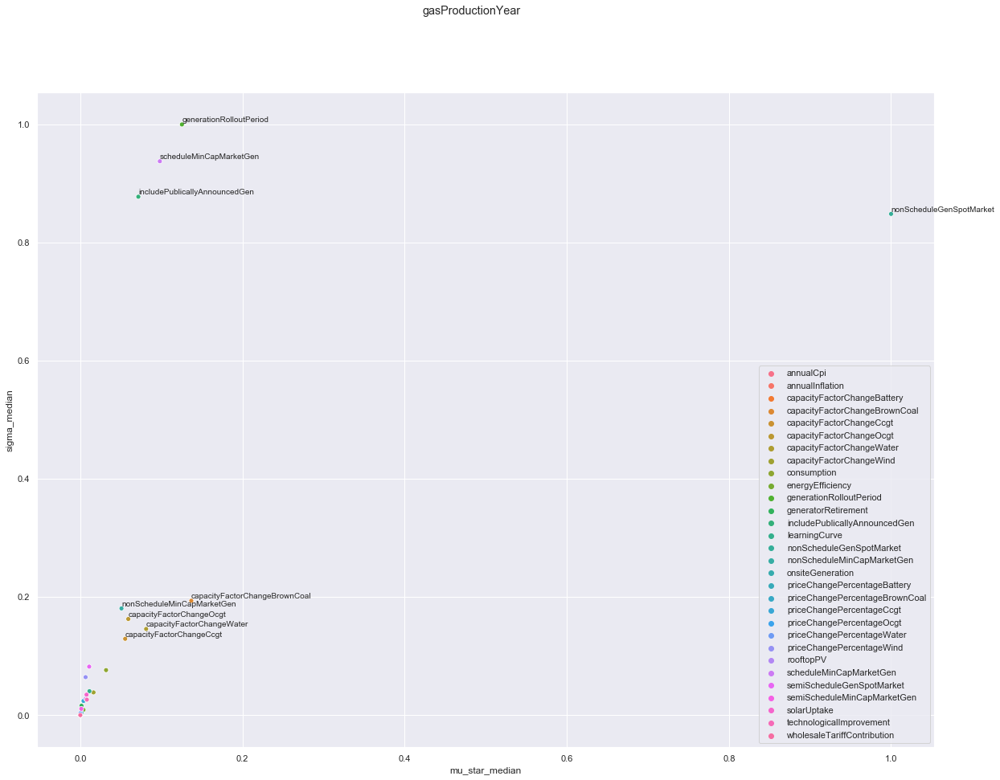

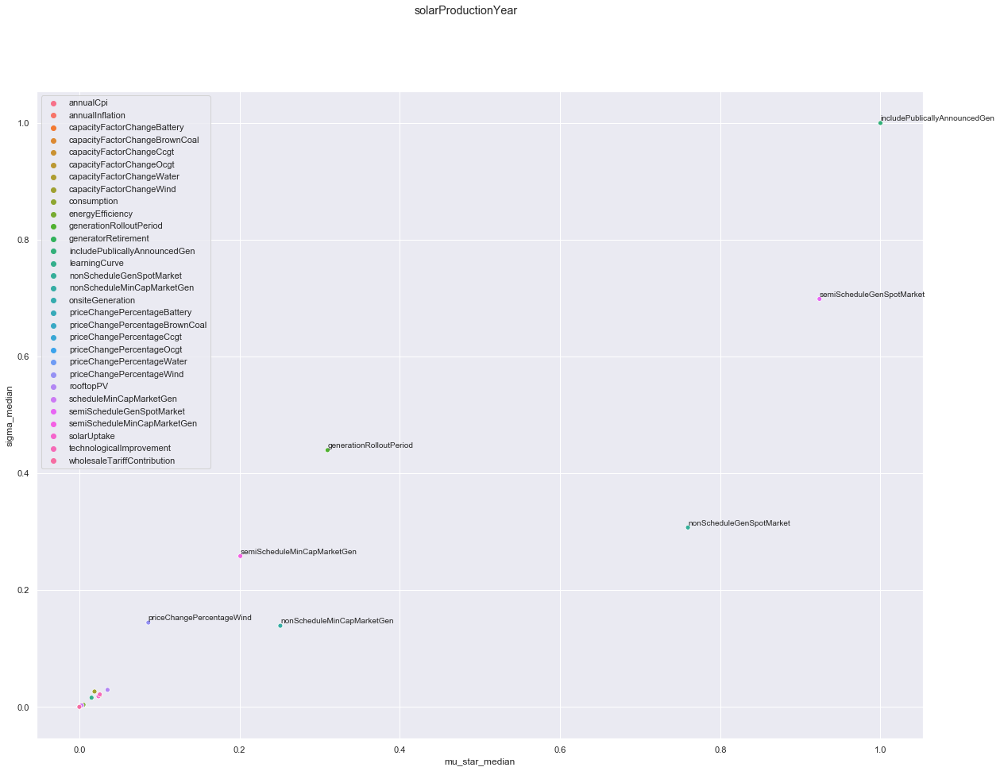

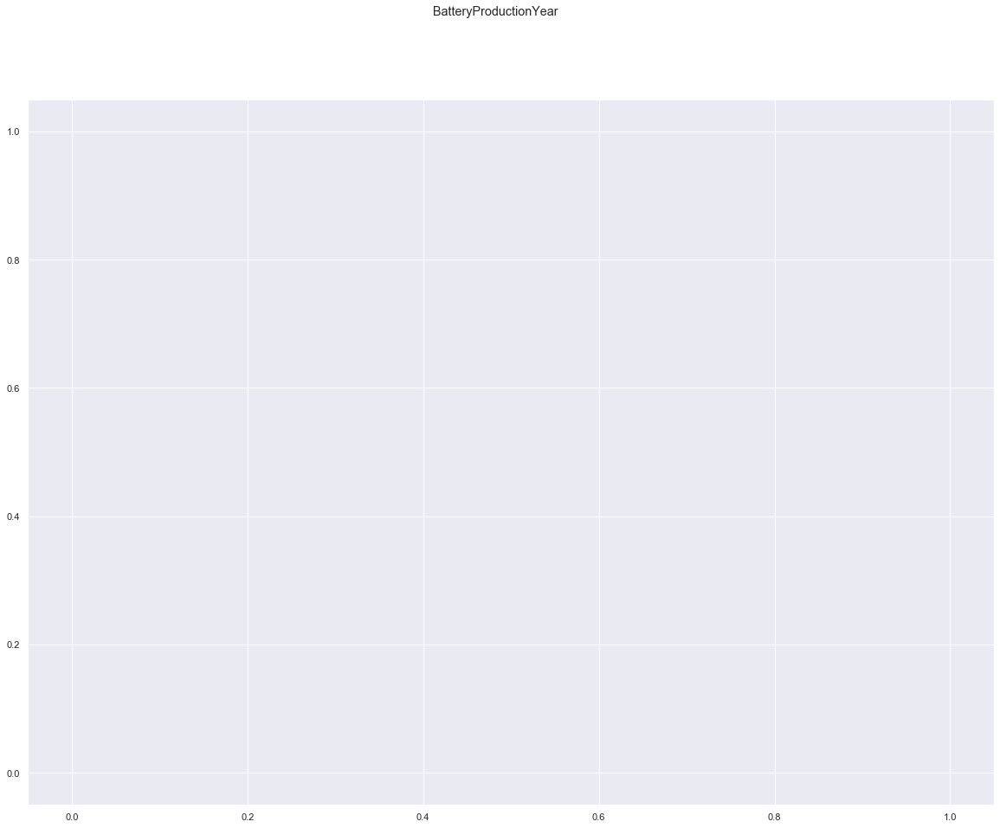

In [16]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

for ooi in outcomes_to_show:
    
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = ( mu_star_median_ooi[ooi] -  mu_star_median_ooi[ooi].min())/( mu_star_median_ooi[ooi].max() -  mu_star_median_ooi[ooi].min())
    normalized_sigma = (sigma_median_ooi[ooi] - sigma_median_ooi[ooi].min())/(sigma_median_ooi[ooi].max() - sigma_median_ooi[ooi].min())
    
    df_max = pd.concat({'mu_star_median': normalized_mu_star,'sigma_median': normalized_sigma}, axis=1)
    
    f=plt.figure(figsize=(20,15))
    f.suptitle(ooi)
    
    
    sns.scatterplot(x='mu_star_median',y='sigma_median', hue=df_max.index, data=df_max)
    
    #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')
    
    #Add labels above points
    for index, row in df_max.iterrows():
            if row['mu_star_median'] <= 0.1 and row['sigma_median'] <= 0.1: continue
            plt.annotate(index, # this is the text
                         (row['mu_star_median'],row['sigma_median']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='left', # horizontal alignment can be left, right or center
                         fontsize=10)  # font size



    print(ooi)

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_median_%s'%(ooi)),dpi=300, bbox_inches='tight')
    
# f.show()
# f.clear()
# plt.close(f)

### Subset significant factors - normalisation median values
Scatter plots of mu_star vs sigma 

consumptionYear - 1
['consumption']
tariffsYear - 10
['capacityFactorChangeBrownCoal' 'capacityFactorChangeWater' 'consumption'
 'generationRolloutPeriod' 'includePublicallyAnnouncedGen'
 'nonScheduleGenSpotMarket' 'priceChangePercentageWater'
 'priceChangePercentageWind' 'semiScheduleGenSpotMarket'
 'wholesaleTariffContribution']
wholesalePriceYear - 14
['annualInflation' 'capacityFactorChangeBrownCoal'
 'capacityFactorChangeWater' 'consumption' 'generationRolloutPeriod'
 'generatorRetirement' 'includePublicallyAnnouncedGen'
 'nonScheduleGenSpotMarket' 'priceChangePercentageBrownCoal'
 'priceChangePercentageOcgt' 'priceChangePercentageWater'
 'priceChangePercentageWind' 'semiScheduleGenSpotMarket'
 'semiScheduleMinCapMarketGen']
GHGYear - 8
['capacityFactorChangeBrownCoal' 'capacityFactorChangeWater' 'consumption'
 'includePublicallyAnnouncedGen' 'nonScheduleGenSpotMarket'
 'priceChangePercentageBrownCoal' 'priceChangePercentageWater'
 'semiScheduleGenSpotMarket']
primarySpotProductio

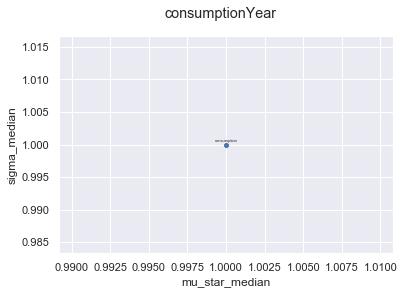

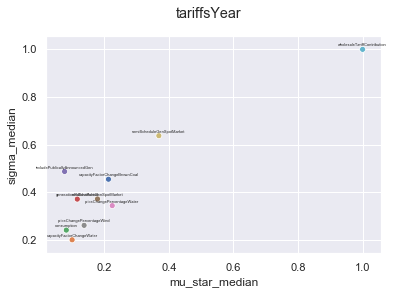

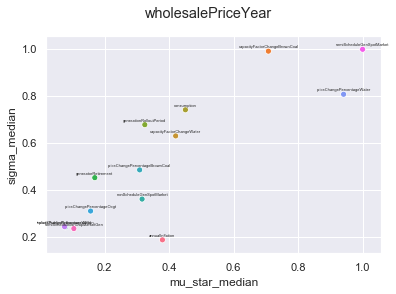

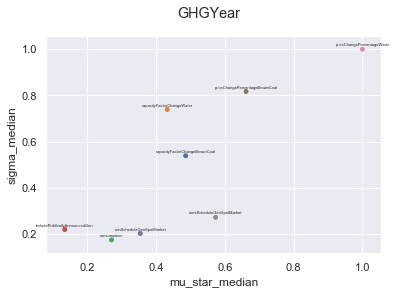

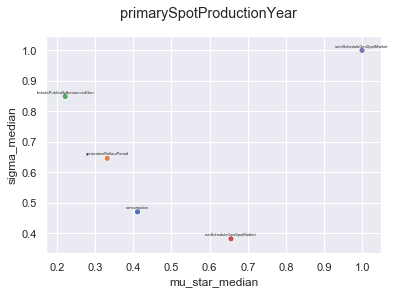

...

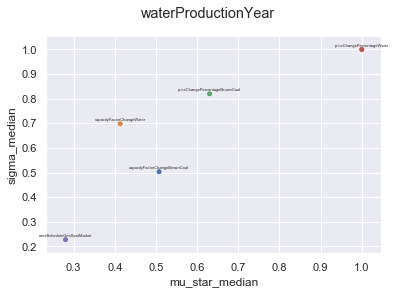

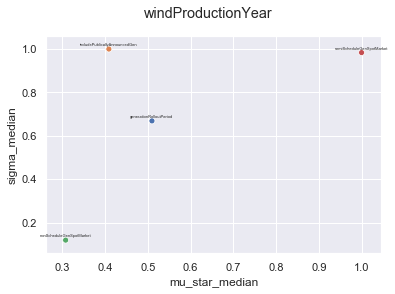

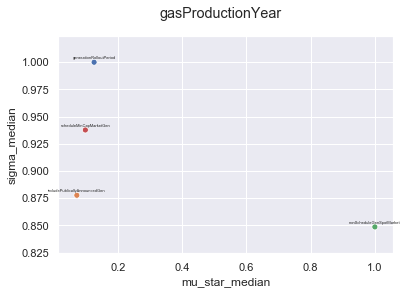

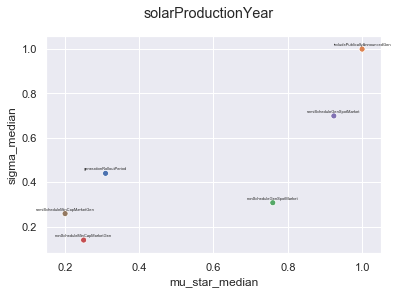

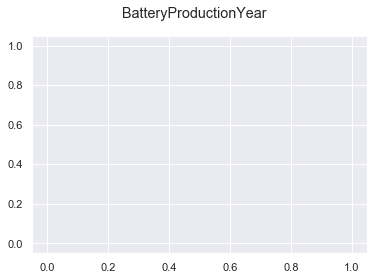

In [17]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.2
significant_inputs_median = set()
significant_inputs_filter_median = {}
for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_median_ooi[ooi] - mu_star_median_ooi[ooi].min())/(mu_star_median_ooi[ooi].max() - mu_star_median_ooi[ooi].min())
    normalized_sigma = (sigma_median_ooi[ooi] - sigma_median_ooi[ooi].min())/(sigma_median_ooi[ooi].max() - sigma_median_ooi[ooi].min())
    
    #filter values
    filter_mu_star = normalized_mu_star > significance_bound
    filter_sigma = normalized_sigma > significance_bound
    normalized_mu_star_filtered = normalized_mu_star[ filter_mu_star | filter_sigma ]
    normalized_sigma_filtered = normalized_sigma[ filter_mu_star | filter_sigma ] 
    
    #keep track significant inputs filter
    significant_inputs_filter_median[ooi] = normalized_mu_star_filtered.index.values
    for l in normalized_mu_star_filtered.index.values:
        significant_inputs_median.add(l) 
    
    #create dataframe     
    df_max = pd.concat({'mu_star_median': normalized_mu_star_filtered,'sigma_median': normalized_sigma_filtered}, axis=1)
    
    #print significant indexes per ooi
    print(ooi + ' - {}'.format(len(significant_inputs_filter_median[ooi])))
    print(significant_inputs_filter_median[ooi])
    
    #create figure
    f=plt.figure()#figsize=(30,20))
    f.suptitle(ooi)
    
    #ScatterPlot        
    #df_max.plot.scatter(x='mu_star_median',y='sigma_median',c='DarkBlue')
    sns.scatterplot(x='mu_star_median',y='sigma_median', hue=df_max.index, data=df_max, legend=False)

    
    #Add labels above points
    for index, row in df_max.iterrows():
            plt.annotate(index, # this is the text
                         (row['mu_star_median'],row['sigma_median']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='center', # horizontal alignment can be left, right or center
                         fontsize=4)  # font size
           
        

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_median_%s_filtered'%(ooi)),dpi=300, bbox_inches='tight')
# f.show()
# f.clear()
# plt.close(f)

print("ALL significant inputs (%d)"%len(significant_inputs_median))
print(significant_inputs_median)

Union of significant factors using max and median values across years

In [18]:
significant_inputs = significant_inputs_max.union(significant_inputs_median)
print("ALL significant inputs Union Max and Median analysis (%d)"%len(significant_inputs))
print(significant_inputs)

ALL significant inputs Union Max and Median analysis (23)
{'annualInflation', 'technologicalImprovement', 'wholesaleTariffContribution', 'semiScheduleGenSpotMarket', 'generationRolloutPeriod', 'priceChangePercentageWater', 'annualCpi', 'priceChangePercentageWind', 'rooftopPV', 'priceChangePercentageBrownCoal', 'solarUptake', 'energyEfficiency', 'nonScheduleMinCapMarketGen', 'semiScheduleMinCapMarketGen', 'consumption', 'capacityFactorChangeBrownCoal', 'includePublicallyAnnouncedGen', 'learningCurve', 'priceChangePercentageOcgt', 'nonScheduleGenSpotMarket', 'scheduleMinCapMarketGen', 'generatorRetirement', 'capacityFactorChangeWater'}


In [19]:
#save significant factors (max and median) into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_significant_max'), engine='xlsxwriter')
significant_inputs_max_df = pd.DataFrame.from_dict(significant_inputs_filter_max,orient='index')
significant_inputs_max_df.to_excel(writer, sheet_name='mu_sigma_max')
writer.save()

writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_significant_median'), engine='xlsxwriter')
significant_inputs_filter_median_df = pd.DataFrame.from_dict(significant_inputs_filter_median,orient='index')
significant_inputs_filter_median_df.to_excel(writer, sheet_name='mu_sigma_median')
writer.save()



## Boxplot

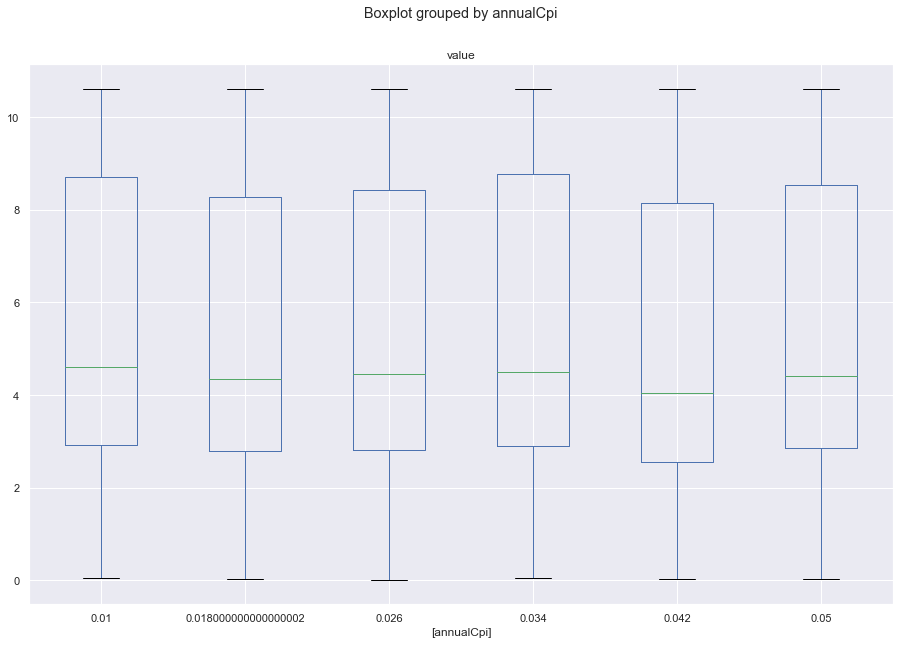

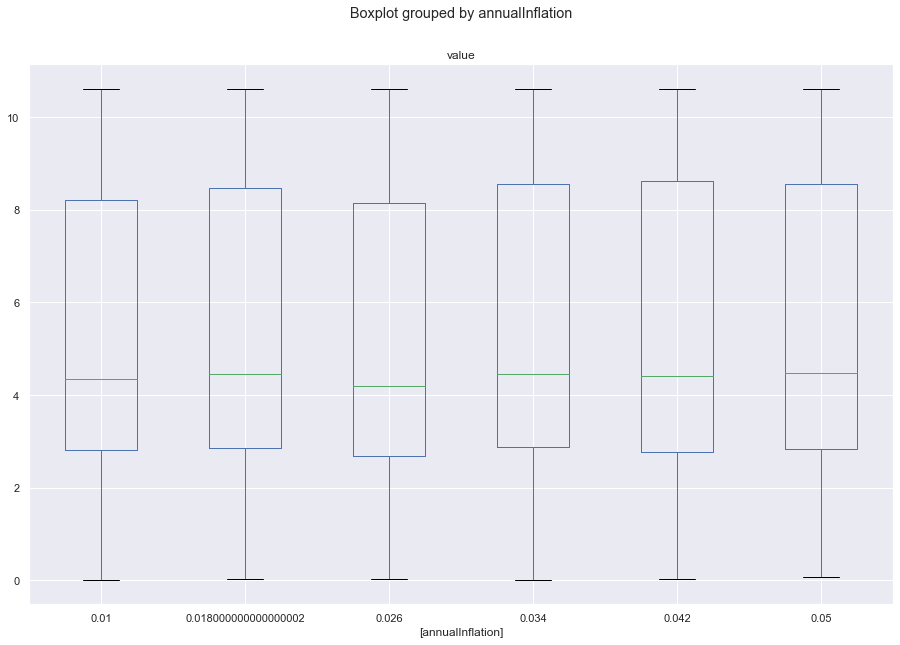

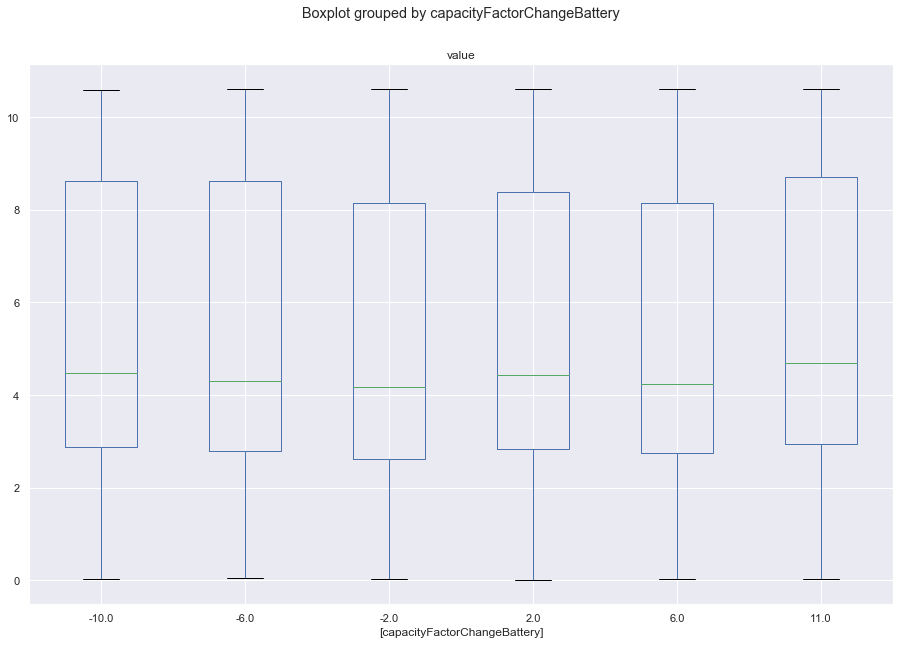

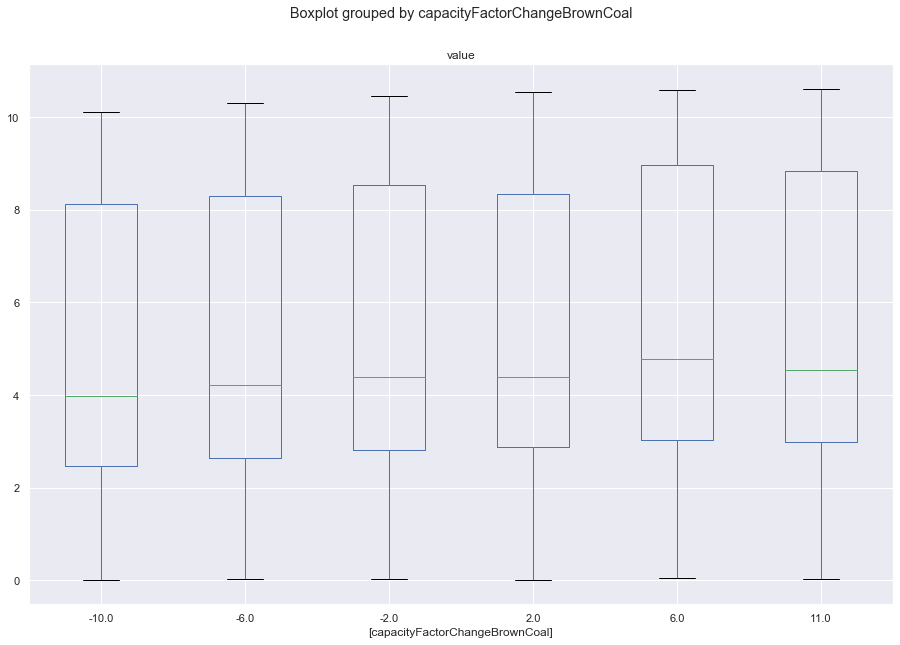

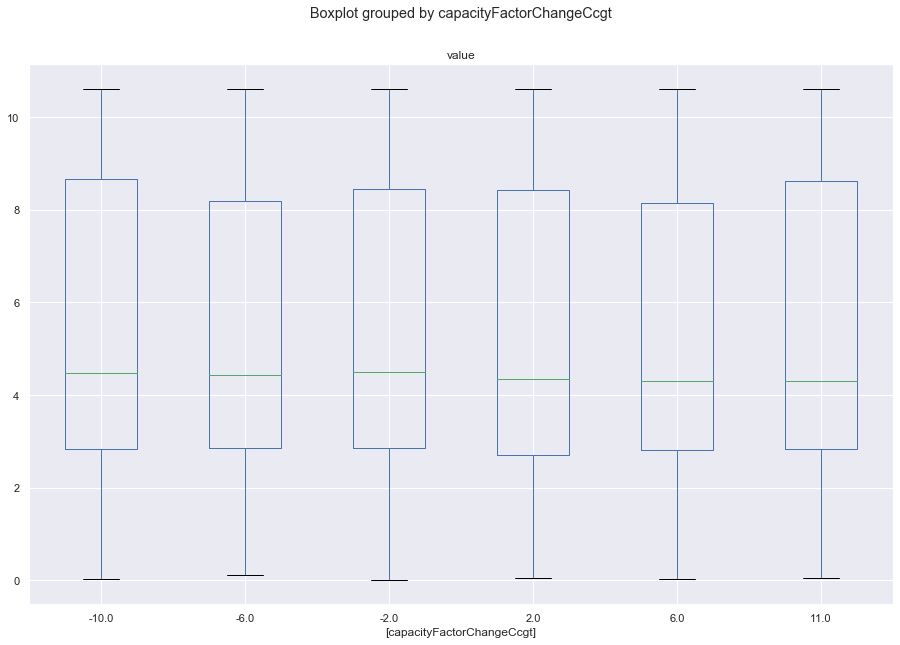

...

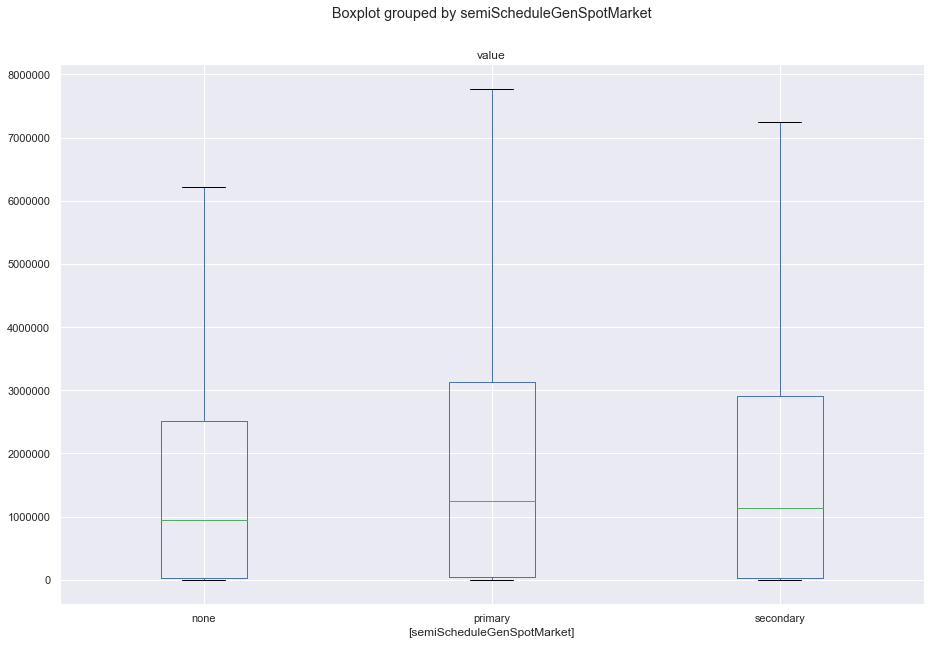

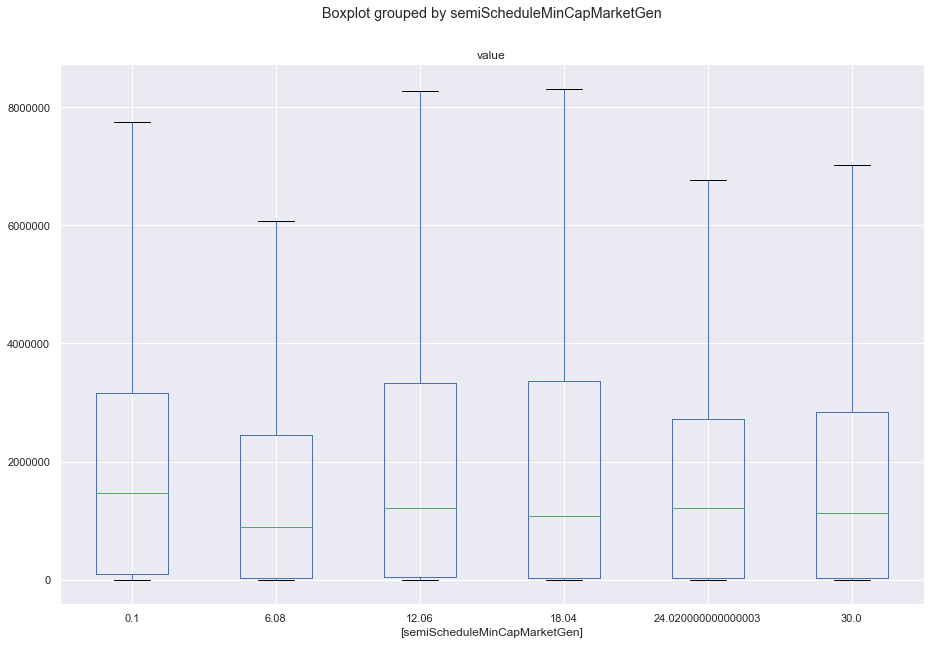

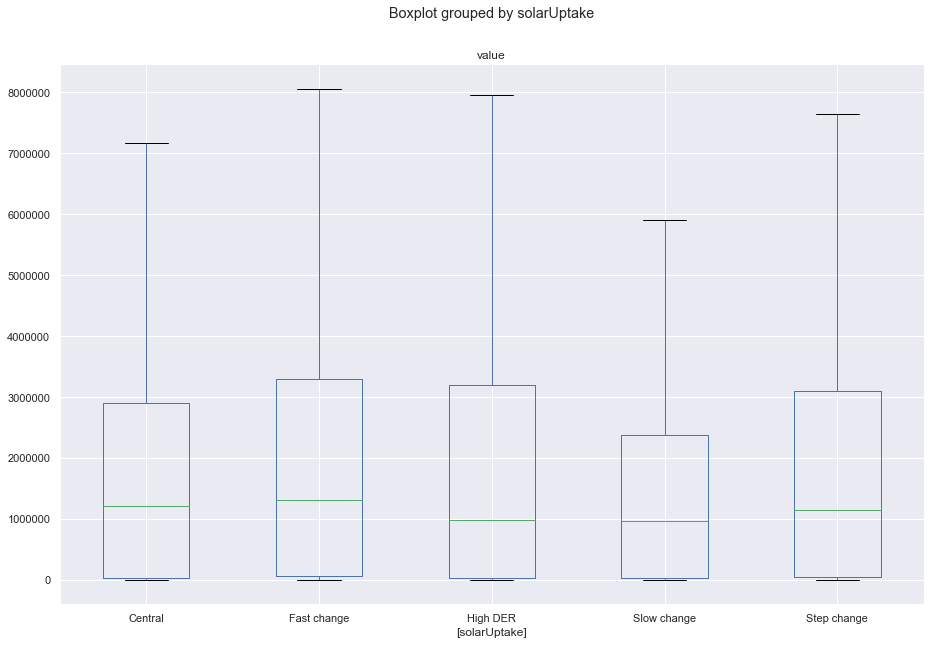

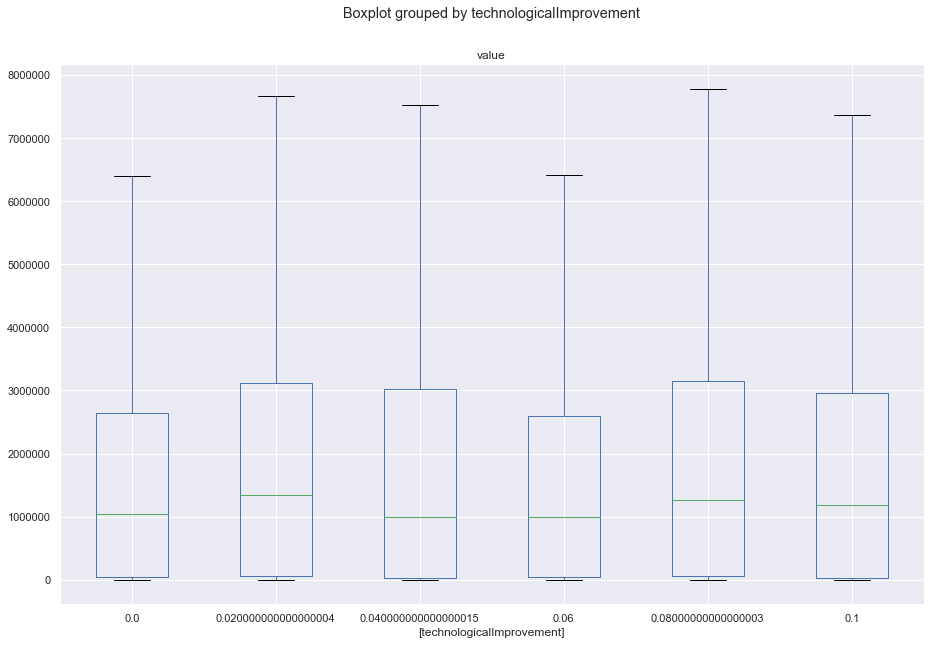

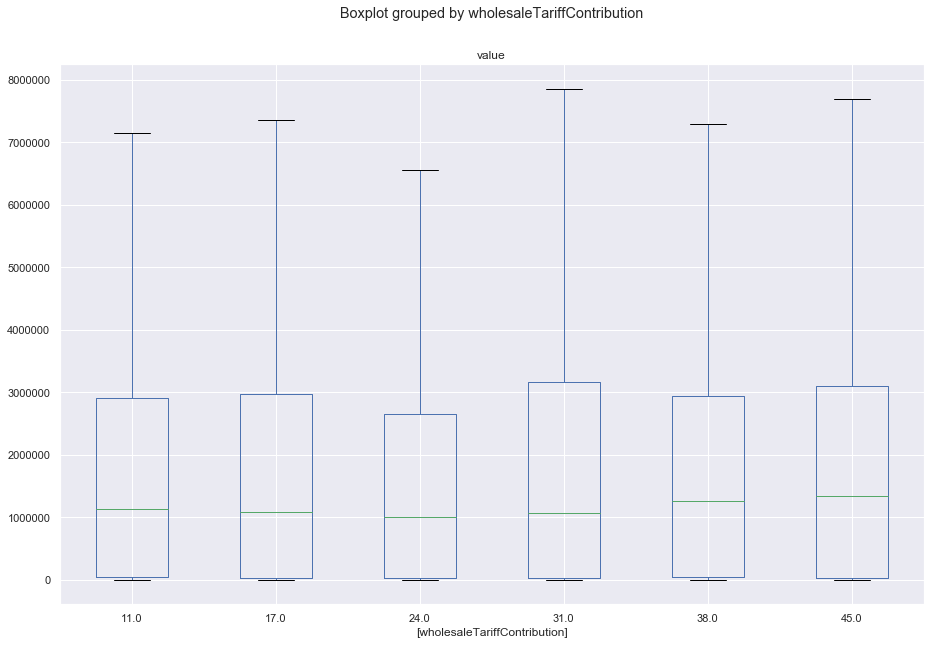

In [26]:
index = pd.to_datetime(time, format = '%Y')

for ooi in outcomes_to_show:
    data = outcomes[ooi][:, startYearShift:]
    
   
    for u in uncertainties:
        dfBoxPlot = pd.DataFrame(index = index, data = data.T,columns=[ experiments[u] ])
        dfMeltdfBoxPlot = pd.melt(dfBoxPlot)
        #dfMeltdfBoxPlot.rename(columns={"value":ooi})
    
        ax = dfMeltdfBoxPlot.boxplot(by=u, meanline=True, showmeans=False, showcaps=True, 
                        showbox=True, showfliers=False, return_type='axes', figsize=(15, 10))
        
        
        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_eet_boxplots_%s_%s'%(ooi,u)), 
                     dpi=300, bbox_inches='tight')
        
       
        plt.show()
        plt.close()
